# **How indoor plants improve our life**

### Dataset 1: "Dataset of Indoor Air Pollutants using Low-Cost Sensors", DOI: 10.17632/2r232jpfb2.1

Indoor air pollutant concentration data is collected for all the seasons in Pune city, India, from internet of things-based system built using low-cost sensors. The raw data contains 1,73,468 records collected from Nov 2020 to July 2022. Air pollutant PM2.5 (Particulate Matter) is measured using GP2Y1010AU0F Dust Smoke Particle Sensor, NO2 (Nitrogen Dioxide), NH3 (Ammonia) and CO (Carbon Monoxide) pollutant measured using MICS-6814 sensor. Ozone (O3) measured using MQ131 Semiconductor Sensor. Temperature, Humidity measured using BME 280 sensor. Measurement units of NH3 is PPM, NO2 in PPM, CO in PPM, PM2.5 in ug/m3, Temperature in Celsius, Pressure in hPa, Humidity in RH, Ozone in PPB. This data can be used for study and evaluations of prediction models, low-cost sensor data and calibration. It can be used for the study of the pollutant’s patterns in COVID-19 pandemic.  It will help policymakers to develop policies to monitor air pollution impact.

In [81]:
# import data file
import csv
import pandas as pd

df1_air_pollution = pd.read_csv("../data/Dataset_of_Indoor_Air_Pollutants_using_Low-Cost_Sensors/Indoor Air Pollution Data.csv", low_memory=False)

In [82]:
# check how the dataset looks like
df1_air_pollution.head()

,NH3,NO2,CO,PM2.5,Temp,Pressure,Humidity,O3,Date,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18
0,0.60,0.16,4.01,0.00,33.53,948.26,51.98,7.37,2020-11-17|11:20:53.407872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.62,0.15,4.13,0.39,33.5,948.18,51.53,9.06,2020-11-17|11:22:41.214724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.69,0.14,4.45,0.39,33.36,948.15,50.5,16.47,2020-11-17|11:24:28.546567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.70,0.14,4.52,0.38,32.18,948.14,53.35,9.8,2020-11-17|11:26:16.884289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.72,0.14,4.56,0.40,31.77,948.08,53.7,17.28,2020-11-17|11:28:19.820781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [83]:
# check the shape
df1_air_pollution.shape

(173468, 19)

In [84]:
# check if there are missing values
df1_air_pollution.isna().sum()

NH3                 3
NO2                 0
CO                  3
PM2.5               3
Temp                3
Pressure            3
Humidity            3
O3                  3
Date                3
Unnamed: 9     173467
Unnamed: 10    173467
Unnamed: 11    173467
Unnamed: 12    173467
Unnamed: 13    173467
Unnamed: 14    173467
Unnamed: 15    173467
Unnamed: 16    173467
Unnamed: 17    173467
Unnamed: 18    173467
dtype: int64

In [85]:
# check the general info
df1_air_pollution.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173468 entries, 0 to 173467
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   NH3          173465 non-null  float64
 1   NO2          173468 non-null  object 
 2   CO           173465 non-null  float64
 3   PM2.5        173465 non-null  float64
 4   Temp         173465 non-null  object 
 5   Pressure     173465 non-null  object 
 6   Humidity     173465 non-null  object 
 7   O3           173465 non-null  object 
 8   Date         173465 non-null  object 
 9   Unnamed: 9   1 non-null       float64
 10  Unnamed: 10  1 non-null       float64
 11  Unnamed: 11  1 non-null       float64
 12  Unnamed: 12  1 non-null       float64
 13  Unnamed: 13  1 non-null       float64
 14  Unnamed: 14  1 non-null       float64
 15  Unnamed: 15  1 non-null       float64
 16  Unnamed: 16  1 non-null       float64
 17  Unnamed: 17  1 non-null       float64
 18  Unnamed: 18  1 non-null 

In [86]:
# delete the last 10 columns (complete columns with NaN values)
df1_air_pollution = df1_air_pollution.iloc[:, :-10]

In [87]:
# replace pipe '|' with space ' '
df1_air_pollution['Date'] = df1_air_pollution['Date'].str.replace('|', ' ', regex=False)

# convert to datetime (flexible parsing)
df1_air_pollution['Date'] = pd.to_datetime(df1_air_pollution['Date'], errors='coerce')

# check missing dates
print(f"Missing dates after conversion: {df1_air_pollution['Date'].isna().sum()}")

# split date and time columns
df1_air_pollution['date'] = df1_air_pollution['Date'].dt.date
df1_air_pollution['time'] = df1_air_pollution['Date'].dt.time

# drop original Date column and reorder
df1_air_pollution.drop(columns=['Date'], inplace=True)
df1_air_pollution.insert(0, 'time', df1_air_pollution.pop('time'))
df1_air_pollution.insert(0, 'date', df1_air_pollution.pop('date'))


Missing dates after conversion: 4


In [88]:
# drop rows where 'date' is NaN
df_PM_removal_PM_removal1_air_pollution = df1_air_pollution.dropna(subset=['date'])

In [89]:
# modify the column names
df1_air_pollution.columns = ["date", "time", "NH3 [ppm]", "NO2 [ppm]", "CO [ppm]", "PM2.5 [ug/m3]", "Temperature [°C]", "Pressure [hPa]", "Humidity [RH]", "O3 [ppb]"]

In [90]:
# convert the columns (except date and tiem) to numeric
for col in df1_air_pollution.columns[2:]:
    df1_air_pollution[col] = pd.to_numeric(df1_air_pollution[col], errors='coerce')

In [91]:
df1_air_pollution.columns

Index(['date', 'time', 'NH3 [ppm]', 'NO2 [ppm]', 'CO [ppm]', 'PM2.5 [ug/m3]',
       'Temperature [°C]', 'Pressure [hPa]', 'Humidity [RH]', 'O3 [ppb]'],
      dtype='object')

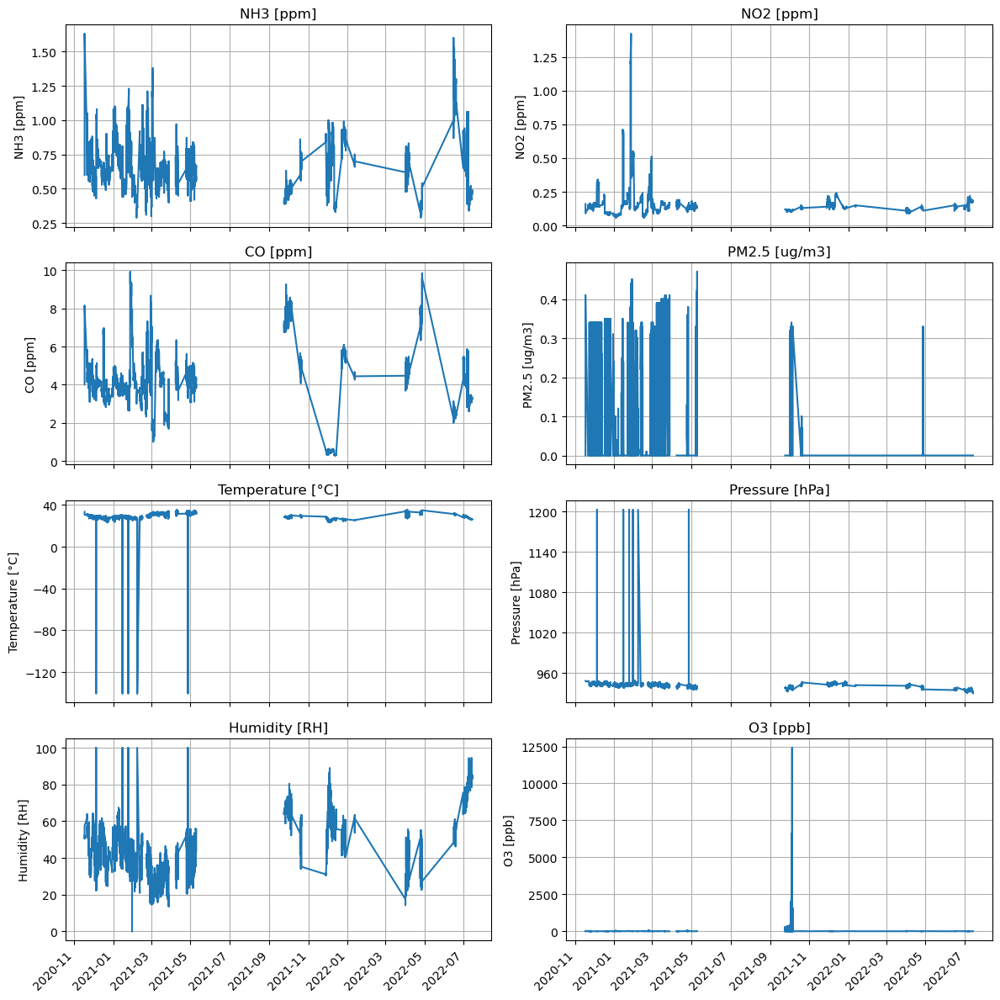

In [92]:
from matplotlib.ticker import MaxNLocator
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# columns to plot (all measurements)
measurements = [
    "NH3 [ppm]", 'NO2 [ppm]', 'CO [ppm]', 'PM2.5 [ug/m3]', "Temperature [°C]", "Pressure [hPa]", "Humidity [RH]", "O3 [ppb]"
]

n = len(measurements)
cols = 2
rows = (n + cols - 1) // cols  # calculate rows needed

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*3), sharex=True)
axes = axes.flatten()

df1_air_pollution['date'] = pd.to_datetime(df1_air_pollution['date'])

for i, meas in enumerate(measurements):
    axes[i].plot(df1_air_pollution['date'], df1_air_pollution[meas])
    axes[i].set_title(meas)
    axes[i].set_ylabel(meas)
    axes[i].grid(True)

    # set max ~6 y-ticks
    axes[i].yaxis.set_major_locator(MaxNLocator(nbins=6))

# remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


# rotate x-axis labels
for ax in axes:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [93]:
# calculate the average of each pollutant per month (to decrease the density of the data)

# ensure the Date column is datetime format
df1_air_pollution['date'] = pd.to_datetime(df1_air_pollution['date'])

# create a month column
df1_air_pollution['Month'] = df1_air_pollution['date'].dt.to_period('M')  # Gives '2025-06' format

# group by month and calculate mean of all other columns
monthly_means = df1_air_pollution.groupby('Month').mean(numeric_only=True).reset_index()


In [94]:
# convert Period to Timestamp (start of the period)
monthly_means['Month'] = monthly_means['Month'].dt.to_timestamp()
df1_monthly_means = monthly_means.reset_index(drop=True)

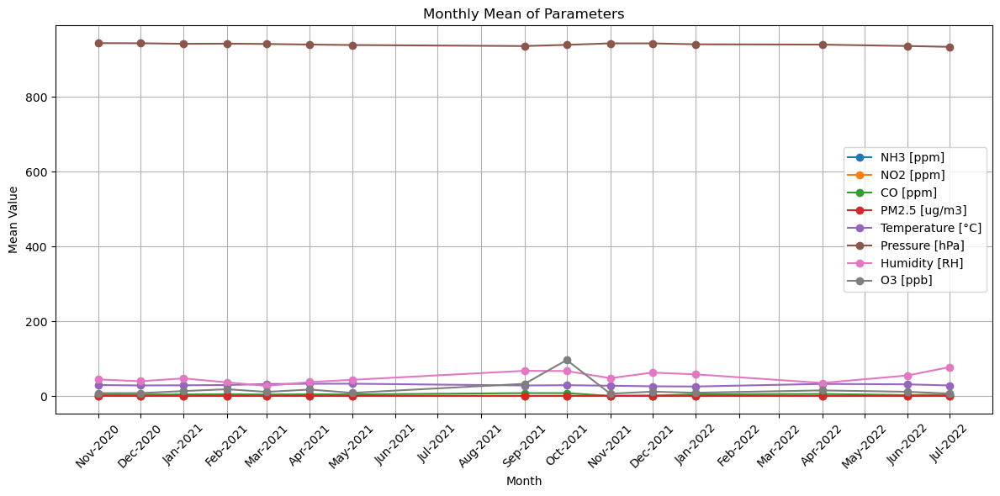

In [95]:
# plot

plt.figure(figsize=(12, 6))

for column in df1_monthly_means.columns:
    if column != 'Month':  # skip the Month column
        # plot each parameter's monthly mean
        plt.plot(df1_monthly_means['Month'], df1_monthly_means[column], marker='o', label=column)

# Format the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Parameters')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

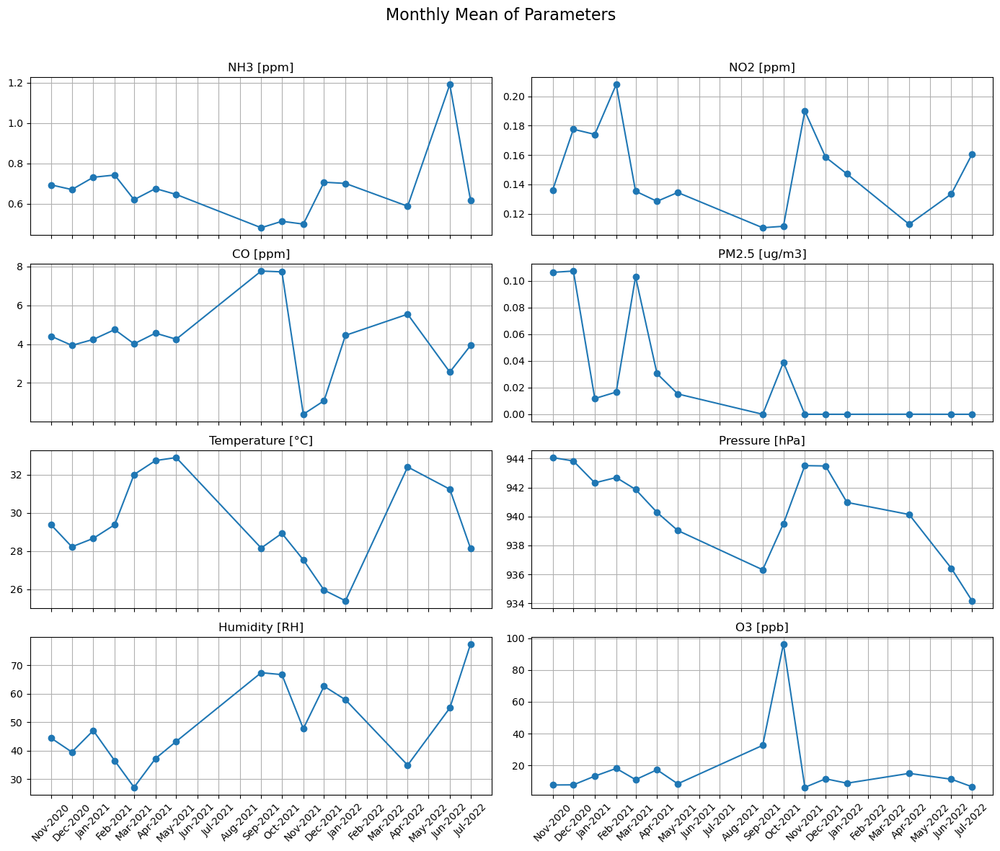

In [96]:
params = df1_monthly_means.columns.drop('Month')
n_params = len(params)

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 12), sharex=True)
axes = axes.flatten()

x = df1_monthly_means['Month']  # datetime64 column

for i, param in enumerate(params):
    axes[i].plot(x, df1_monthly_means[param], marker='o')
    axes[i].set_title(param)
    axes[i].grid(True)
    axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    axes[i].tick_params(axis='x', rotation=45)

# remove any unused subplots (in case n_params < 8)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Monthly Mean of Parameters', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

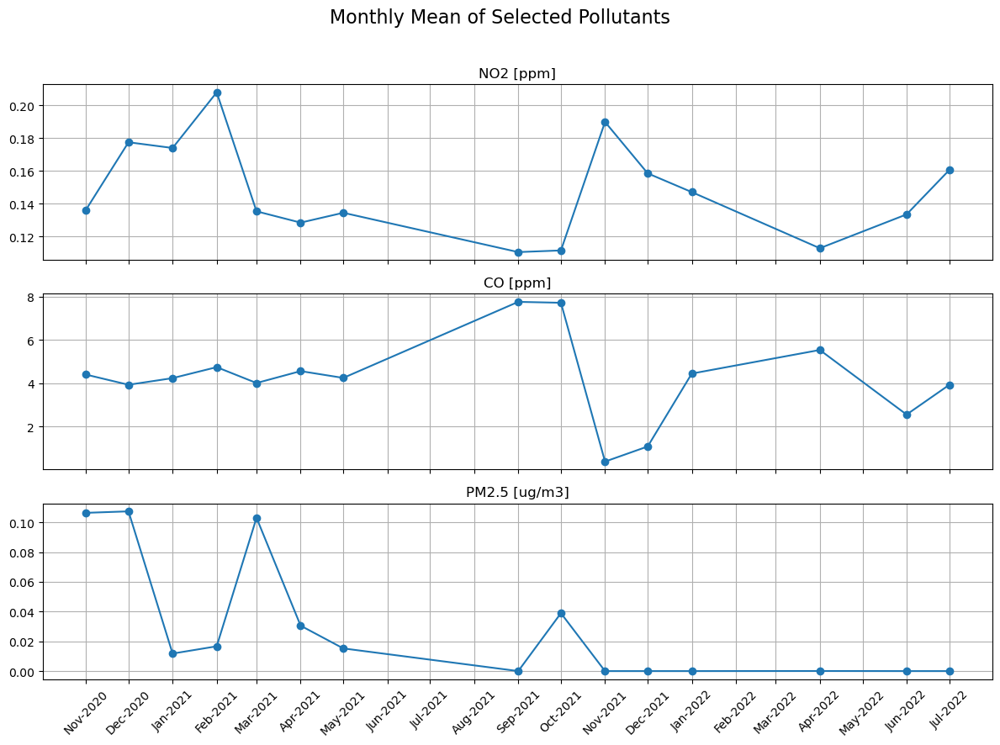

In [97]:
# select only the desired pollutants
params = ['NO2 [ppm]', 'CO [ppm]', 'PM2.5 [ug/m3]']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 9), sharex=True)
axes = axes.flatten()

x = df1_monthly_means['Month']  # datetime x-axis

for i, param in enumerate(params):
    axes[i].plot(x, df1_monthly_means[param], marker='o')
    axes[i].set_title(param)
    axes[i].grid(True)
    axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    axes[i].tick_params(axis='x', rotation=45)

fig.suptitle('Monthly Mean of Selected Pollutants', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

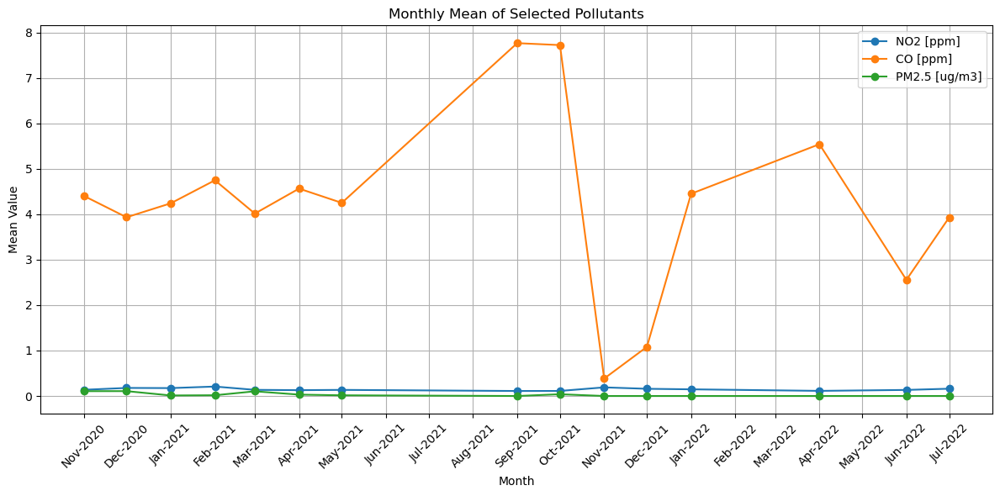

In [98]:
params = ['NO2 [ppm]', 'CO [ppm]', 'PM2.5 [ug/m3]']
x = df1_monthly_means['Month']

plt.figure(figsize=(12, 6))

for param in params:
    plt.plot(x, df1_monthly_means[param], marker='o', label=param)

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Selected Pollutants')
plt.legend()
plt.grid(True)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Dataset 2: "IoT Indoor Air Quality", DOI: 10.34740/kaggle/dsv/11462898

This dataset presents real-time Indoor Air Quality (IAQ) data collected from multiple IoT-enabled environmental sensors deployed in a controlled indoor environment. The aim of this dataset is to support research and development in the domain of smart environmental monitoring systems, air quality classification, and health-aware AI applications.

In [99]:
df2_air_pollution = pd.read_csv("../data/IoT_Indoor_Air_Quality/IoT_Indoor_Air_Quality_Dataset.csv")

In [100]:
df2_air_pollution.head()

,Timestamp,Temperature (?C),Humidity (%),CO2 (ppm),PM2.5 (?g/m?),PM10 (?g/m?),TVOC (ppb),CO (ppm),Light Intensity (lux),Motion Detected,Occupancy Count,Ventilation Status
0,18-02-2024 08:00,21.75,63.11,989.74,31.17,89.66,226.83,2.84,646.86,0.0,49.0,Open
1,18-02-2024 08:05,27.51,68.03,924.59,27.32,44.82,116.76,3.12,845.45,1.0,11.0,Open
2,18-02-2024 08:10,25.32,53.51,604.05,73.84,71.08,56.59,3.59,560.03,1.0,29.0,Closed
3,18-02-2024 08:15,23.99,58.52,692.20,62.94,10.90,228.06,2.66,499.84,1.0,28.0,Closed
4,18-02-2024 08:20,19.56,69.34,533.12,26.56,88.06,267.26,1.76,411.36,1.0,16.0,Closed


In [101]:
df2_air_pollution = df2_air_pollution.iloc[:, :-3]

In [102]:
# convert 'Timestamp' to datetime type with the correct format
df2_air_pollution['Timestamp'] = pd.to_datetime(df2_air_pollution['Timestamp'], format='%d-%m-%Y %H:%M')

# create new columns for date and time
df2_air_pollution['date'] = df2_air_pollution['Timestamp'].dt.date
df2_air_pollution['time'] = df2_air_pollution['Timestamp'].dt.time

# drop original Date column and reorder
df2_air_pollution.drop(columns=['Timestamp'], inplace=True)
df2_air_pollution.insert(0, 'time', df2_air_pollution.pop('time'))
df2_air_pollution.insert(0, 'date', df2_air_pollution.pop('date'))

In [103]:
df2_air_pollution.isna().sum()

date                        0
time                        0
Temperature (?C)         1949
Humidity (%)             1949
CO2 (ppm)                1949
PM2.5 (?g/m?)            1949
PM10 (?g/m?)             1949
TVOC (ppb)               1949
CO (ppm)                 1949
Light Intensity (lux)    1949
dtype: int64

In [104]:
df2_air_pollution.shape

(97458, 10)

In [105]:
df2_air_pollution = df2_air_pollution.dropna()

In [106]:
df2_air_pollution.info()

<class 'pandas.core.frame.DataFrame'>
Index: 82909 entries, 0 to 97457
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   date                   82909 non-null  object 
 1   time                   82909 non-null  object 
 2   Temperature (?C)       82909 non-null  float64
 3   Humidity (%)           82909 non-null  float64
 4   CO2 (ppm)              82909 non-null  float64
 5   PM2.5 (?g/m?)          82909 non-null  float64
 6   PM10 (?g/m?)           82909 non-null  float64
 7   TVOC (ppb)             82909 non-null  float64
 8   CO (ppm)               82909 non-null  float64
 9   Light Intensity (lux)  82909 non-null  float64
dtypes: float64(8), object(2)
memory usage: 7.0+ MB


In [107]:
cols = list(df2_air_pollution.columns)  # get current column names as a list

# find the index of the column you want to rename, then assign the new name
cols[cols.index('Temperature (?C)')] = 'Temperature/°C'
cols[cols.index('PM2.5 (?g/m?)')] = 'PM2.5/µg/m3'
cols[cols.index('PM10 (?g/m?)')] = 'PM10/µg/m3'

# assign the modified list back to df.columns
df2_air_pollution.columns = cols

In [108]:
df2_air_pollution.columns

Index(['date', 'time', 'Temperature/°C', 'Humidity (%)', 'CO2 (ppm)',
       'PM2.5/µg/m3', 'PM10/µg/m3', 'TVOC (ppb)', 'CO (ppm)',
       'Light Intensity (lux)'],
      dtype='object')

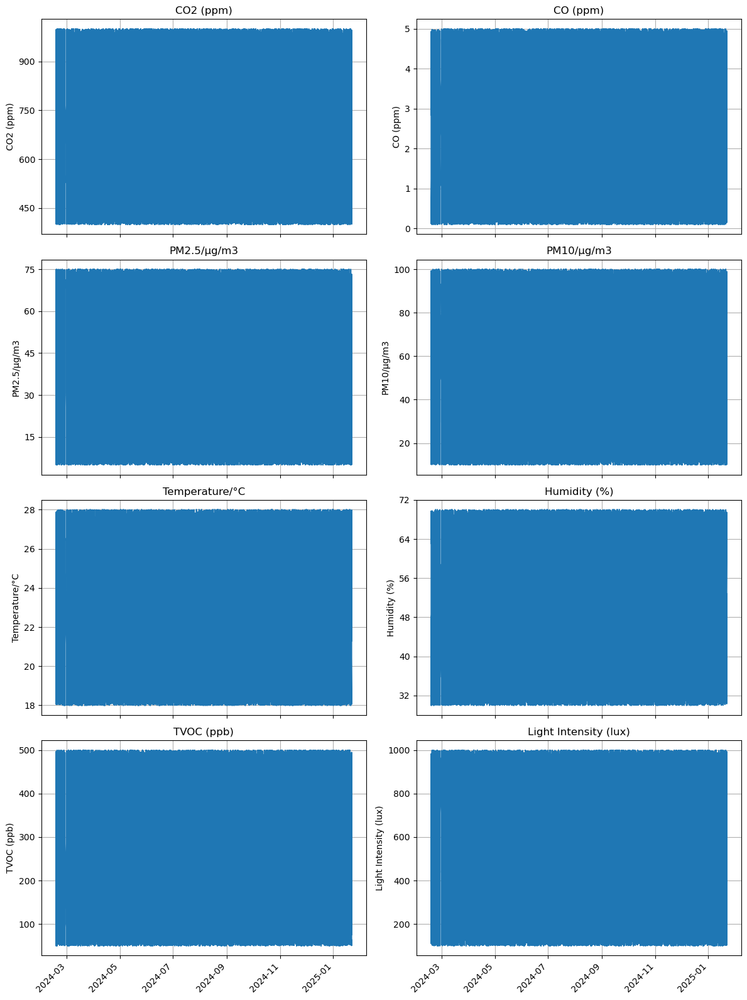

In [109]:
# columns to plot (all measurements)
measurements = [
    'CO2 (ppm)', 'CO (ppm)', 'PM2.5/µg/m3', 'PM10/µg/m3', "Temperature/°C", "Humidity (%)", "TVOC (ppb)", "Light Intensity (lux)"
]

n = len(measurements)
cols = 2
rows = (n + cols - 1) // cols  # calculate rows needed

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*4), sharex=True)
axes = axes.flatten()

for i, meas in enumerate(measurements):
    axes[i].plot(df2_air_pollution['date'], df2_air_pollution[meas])
    axes[i].set_title(meas)
    axes[i].set_ylabel(meas)
    axes[i].grid(True)

    # set max ~6 y-ticks
    axes[i].yaxis.set_major_locator(MaxNLocator(nbins=6))

# remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


# rotate x-axis labels
for ax in axes:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [110]:
# calculate the average of each pollutant per month (to decrease the density of the data)

# ensure the Date column is datetime
df2_air_pollution['date'] = pd.to_datetime(df2_air_pollution['date'])

# create a month column
df2_air_pollution['Month'] = df2_air_pollution['date'].dt.to_period('M')  # Gives '2025-06' format

# group by month and calculate mean of all other columns
monthly_means = df2_air_pollution.groupby('Month').mean(numeric_only=True).reset_index()

In [111]:
# convert Period to Timestamp (start of the period)
monthly_means['Month'] = monthly_means['Month'].dt.to_timestamp()
df2_monthly_means = monthly_means.reset_index(drop=True)

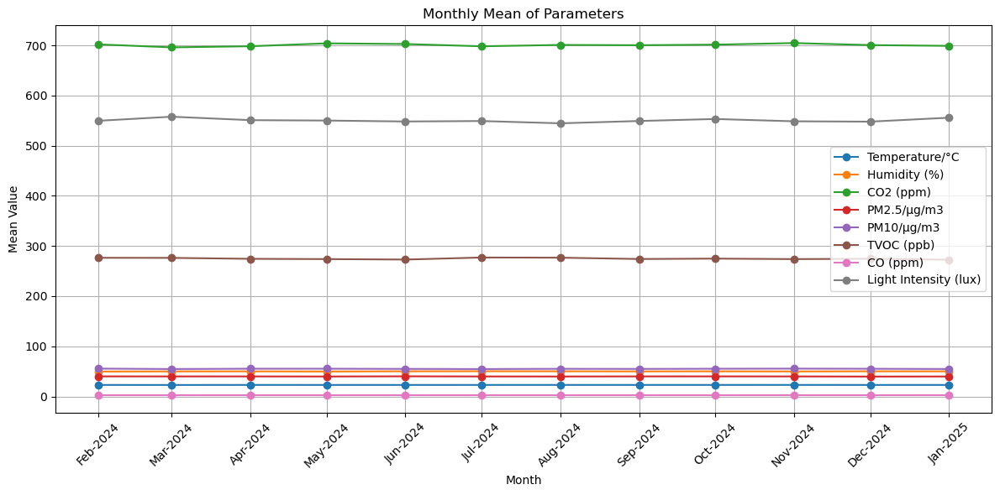

In [112]:
plt.figure(figsize=(12, 6))

for column in df2_monthly_means.columns:
    if column != 'Month':  # skip the Month column
        # Plot each parameter's monthly mean
        plt.plot(df2_monthly_means['Month'], df2_monthly_means[column], marker='o', label=column)

# format the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Parameters')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

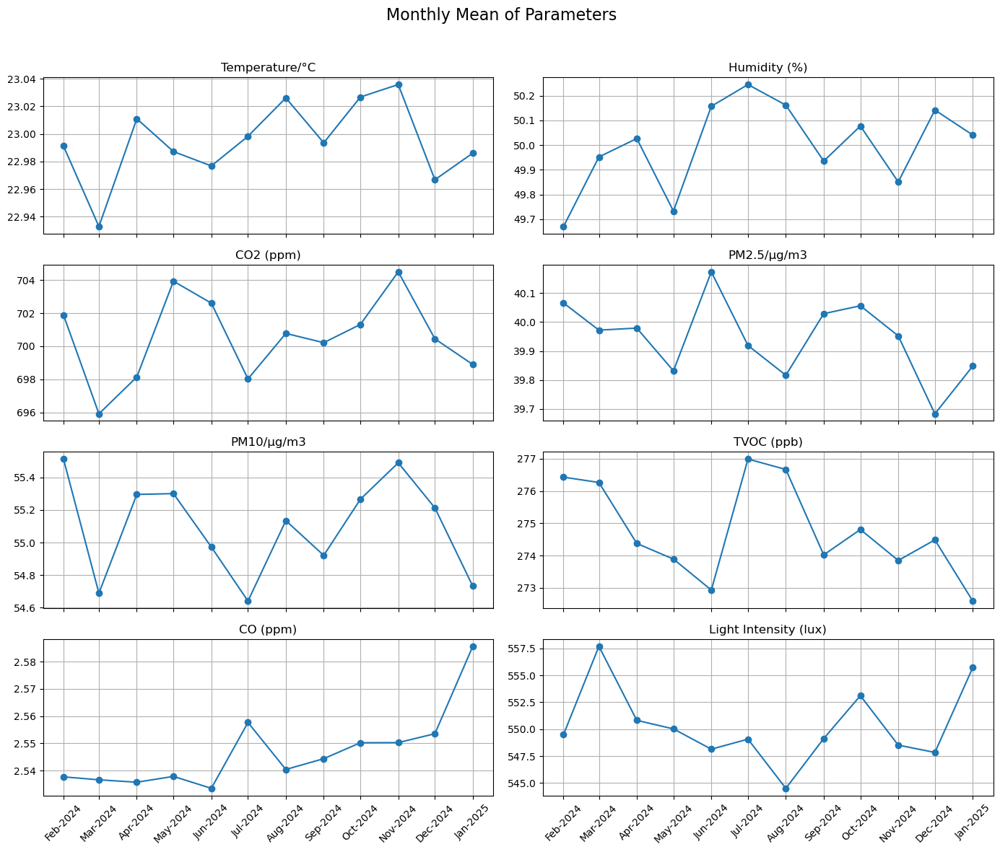

In [113]:
params = df2_monthly_means.columns.drop('Month')
n_params = len(params)

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 12), sharex=True)
axes = axes.flatten()

x = df2_monthly_means['Month']  # datetime64 column

for i, param in enumerate(params):
    axes[i].plot(x, df2_monthly_means[param], marker='o')
    axes[i].set_title(param)
    axes[i].grid(True)
    axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    axes[i].tick_params(axis='x', rotation=45)

# remove any unused subplots (in case n_params < 8)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Monthly Mean of Parameters', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

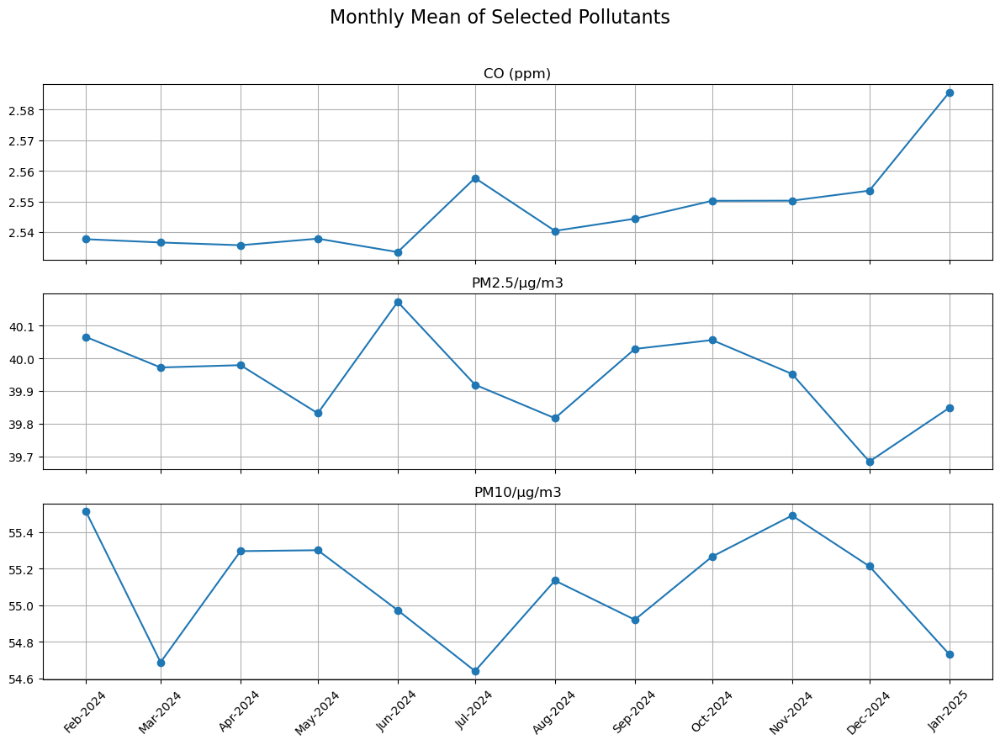

In [114]:
# select only the desired pollutants
params = ['CO (ppm)', 'PM2.5/µg/m3', 'PM10/µg/m3']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 9), sharex=True)
axes = axes.flatten()

x = df2_monthly_means['Month']  # datetime x-axis

for i, param in enumerate(params):
    axes[i].plot(x, df2_monthly_means[param], marker='o')
    axes[i].set_title(param)
    axes[i].grid(True)
    axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    axes[i].tick_params(axis='x', rotation=45)

fig.suptitle('Monthly Mean of Selected Pollutants', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

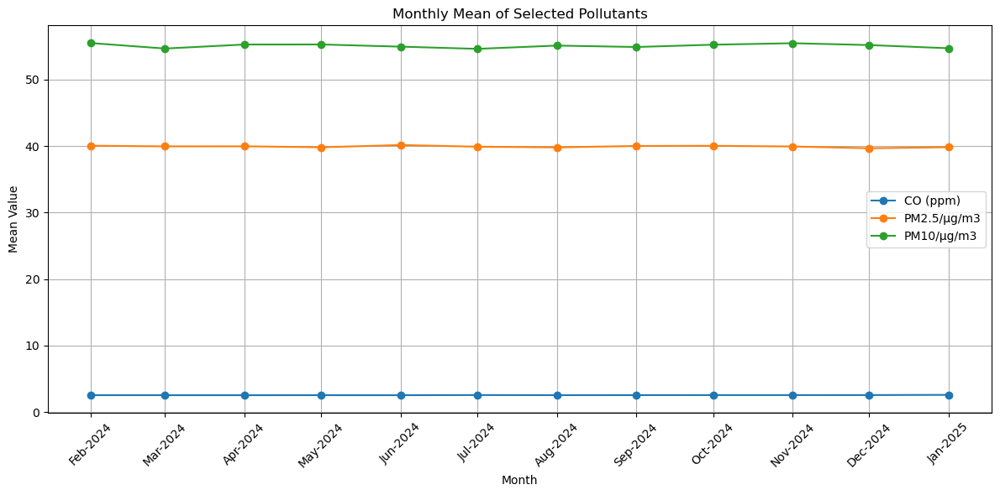

In [115]:
params = ['CO (ppm)', 'PM2.5/µg/m3', 'PM10/µg/m3']
x = df2_monthly_means['Month']

plt.figure(figsize=(12, 6))

for param in params:
    plt.plot(x, df2_monthly_means[param], marker='o', label=param)

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Selected Pollutants')
plt.legend()
plt.grid(True)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Dataset 3: "2023 Indoor Air Quality Dataset"

The data was collected using an airQ sensor (science model).
The air quality data were collected for a project of the Aachen University of Applied Sciences in order to perform further analysis.

## Laboratory

In [116]:
df3_air_pollution = pd.read_csv("../data/2023_Indoor_Air_Quality_Dataset_Germany/laboratory.csv")

In [117]:
df3_air_pollution.head()

,TypPS,oxygen,pm10,cnt0_5,co,temperature,performance,co2,measuretime,so2,...,health,temperature_o2,cnt2_5,o3,humidity,dHdt,humidity_abs,sound,pm2_5,cnt0_3
0,14.966,20.688,0.007,4.867,1.522,20.867,910.0,548.505,1876,38.461,...,968.0,24.841,0.014,11.550,44.833,-0.03,8.182,21.999,0.0,16.234
1,14.996,20.687,0.001,3.496,1.521,20.865,915.0,543.500,1887,38.462,...,942.0,24.845,0.002,11.520,44.784,-0.06,8.172,24.962,0.0,14.324
2,15.000,20.687,0.000,5.134,1.521,20.866,916.0,542.134,1858,38.463,...,938.0,24.834,0.000,11.506,44.768,-0.07,8.170,25.293,0.0,15.826
3,14.081,20.688,0.213,4.223,1.521,20.864,918.0,539.314,1856,38.462,...,936.0,24.834,0.618,11.438,44.766,-0.04,8.169,26.403,0.0,12.719
4,14.258,20.687,0.152,8.701,1.522,20.867,915.0,543.551,1862,38.462,...,935.0,24.838,0.543,11.393,44.768,0.00,8.170,25.934,0.0,26.107


In [118]:
df3_air_pollution.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51186 entries, 0 to 51185
Data columns (total 31 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   TypPS           51186 non-null  float64
 1   oxygen          51186 non-null  float64
 2   pm10            51186 non-null  float64
 3   cnt0_5          51186 non-null  float64
 4   co              51186 non-null  float64
 5   temperature     51186 non-null  float64
 6   performance     51186 non-null  float64
 7   co2             51186 non-null  float64
 8   measuretime     51186 non-null  int64  
 9   so2             51186 non-null  float64
 10  no2             51186 non-null  float64
 11  cnt5            51186 non-null  float64
 12  timestamp       51186 non-null  object 
 13  pm1             51186 non-null  float64
 14  cnt1            51186 non-null  float64
 15  dewpt           51186 non-null  float64
 16  tvoc            51186 non-null  float64
 17  pressure        51186 non-null 

In [119]:
df3_air_pollution.drop(columns=['TypPS', "oxygen", "cnt0_5", "performance", "cnt5", "cnt1", "dewpt", "cnt10", "dCO2dt", "sound_max", "temperature_o2", "cnt2_5", "dHdt", "humidity_abs", "sound", "cnt0_3", "measuretime"], inplace=True)

In [120]:
df3_air_pollution.isna().sum()

pm10           0
co             0
temperature    0
co2            0
so2            0
no2            0
timestamp      0
pm1            0
tvoc           0
pressure       0
health         0
o3             0
humidity       0
pm2_5          0
dtype: int64

In [121]:
df3_air_pollution.head()

,pm10,co,temperature,co2,so2,no2,timestamp,pm1,tvoc,pressure,health,o3,humidity,pm2_5
0,0.007,1.522,20.867,548.505,38.461,27.406,2023-03-22 17:42:49,0.0,0.0,983.066,968.0,11.550,44.833,0.0
1,0.001,1.521,20.865,543.500,38.462,27.771,2023-03-22 17:44:48,0.0,0.0,983.102,942.0,11.520,44.784,0.0
2,0.000,1.521,20.866,542.134,38.463,27.913,2023-03-22 17:46:50,0.0,0.0,983.112,938.0,11.506,44.768,0.0
3,0.213,1.521,20.864,539.314,38.462,28.165,2023-03-22 17:48:48,0.0,0.0,983.112,936.0,11.438,44.766,0.0
4,0.152,1.522,20.867,543.551,38.462,28.421,2023-03-22 17:50:49,0.0,0.0,983.097,935.0,11.393,44.768,0.0


In [122]:
df3_air_pollution.rename(columns={
    "pm10": "PM10/µg/m3",
    "co": "CO/ppm",
    "temperature": "Temperature/°C",
    "co2": "CO2/ppm",
    "so2": "SO2/µg/m3",
    "no2": "NO2/µg/m3",
    "timestamp": "timestamp",
    "pm1": "PM1/µg/m3",
    "tvoc": "TVOC/ppb",
    "pressure" : "Pressure/hPa",
    "health": "Health index",
    "o3": "O3/µg/m3",
    "humidity": "Humidity/%",
    "pm2_5": "PM2.5/µg/m3"
}, inplace=True)

In [123]:
# convert 'timestamp' to datetime type with the correct format
df3_air_pollution['timestamp'] = pd.to_datetime(df3_air_pollution['timestamp'], format="%Y-%m-%d %H:%M:%S")

# create new columns for date and time
df3_air_pollution['date'] = df3_air_pollution['timestamp'].dt.date
df3_air_pollution['time'] = df3_air_pollution['timestamp'].dt.time

# drop original Date column and reorder
df3_air_pollution.drop(columns=['timestamp'], inplace=True)
df3_air_pollution.insert(0, 'time', df3_air_pollution.pop('time'))
df3_air_pollution.insert(0, 'date', df3_air_pollution.pop('date'))

In [124]:
df3_air_pollution.columns

Index(['date', 'time', 'PM10/µg/m3', 'CO/ppm', 'Temperature/°C', 'CO2/ppm',
       'SO2/µg/m3', 'NO2/µg/m3', 'PM1/µg/m3', 'TVOC/ppb', 'Pressure/hPa',
       'Health index', 'O3/µg/m3', 'Humidity/%', 'PM2.5/µg/m3'],
      dtype='object')

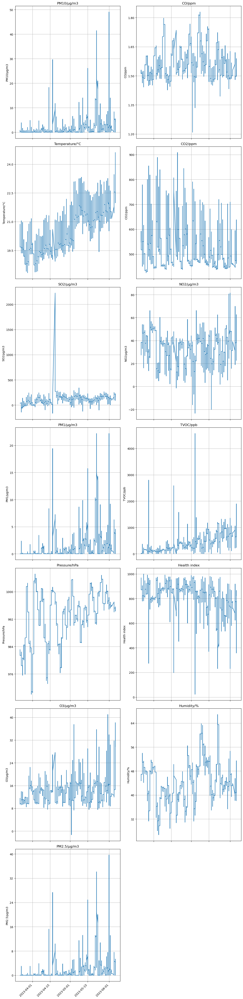

In [125]:
# columns to plot (all measurements)
measurements = [
    'PM10/µg/m3', 'CO/ppm', 'Temperature/°C', 'CO2/ppm',
    'SO2/µg/m3', 'NO2/µg/m3', 'PM1/µg/m3', 'TVOC/ppb', 'Pressure/hPa',
    'Health index', 'O3/µg/m3', 'Humidity/%', 'PM2.5/µg/m3'
]

n = len(measurements)
cols = 2
rows = (n + cols - 1) // cols  # calculate rows needed

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*7), sharex=True)
axes = axes.flatten()

for i, meas in enumerate(measurements):
    axes[i].plot(df3_air_pollution['date'], df3_air_pollution[meas])
    axes[i].set_title(meas)
    axes[i].set_ylabel(meas)
    axes[i].grid(True)

    # set max ~6 y-ticks
    axes[i].yaxis.set_major_locator(MaxNLocator(nbins=6))

# remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


# rotate x-axis labels
for ax in axes:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [126]:
# calculate the average of each pollutant per month (to decrease the density of the data)

# ensure the Date column is datetime
df3_air_pollution['date'] = pd.to_datetime(df3_air_pollution['date'])

# create a month column
df3_air_pollution['Month'] = df3_air_pollution['date'].dt.to_period('M')  # Gives '2025-06' format

# group by month and calculate mean of all other columns
monthly_means = df3_air_pollution.groupby('Month').mean(numeric_only=True).reset_index()

In [127]:
# convert Period to Timestamp (start of the period)
monthly_means['Month'] = monthly_means['Month'].dt.to_timestamp()
df3_monthly_means = monthly_means.reset_index(drop=True)

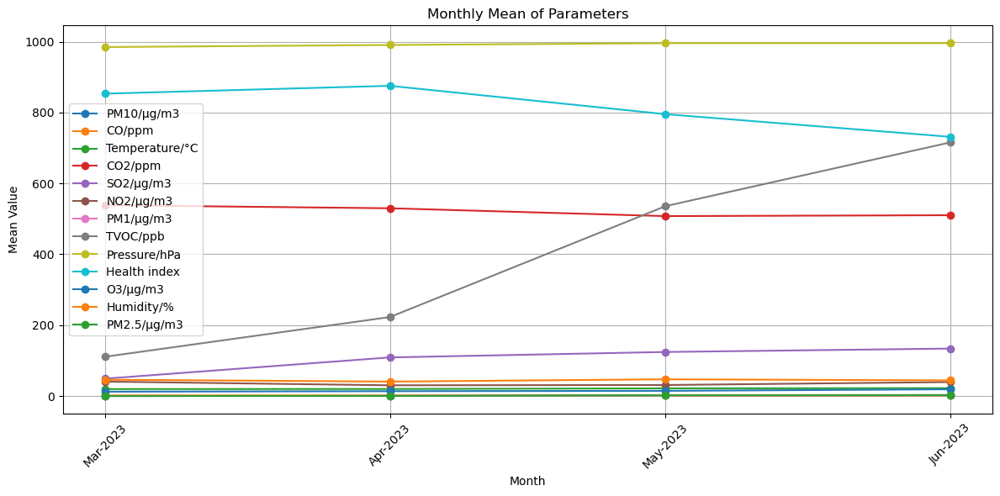

In [128]:
plt.figure(figsize=(12, 6))

for column in df3_monthly_means.columns:
    if column != 'Month':  # skip the Month column
        # plot each parameter's monthly mean
        plt.plot(df3_monthly_means['Month'], df3_monthly_means[column], marker='o', label=column)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Parameters')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

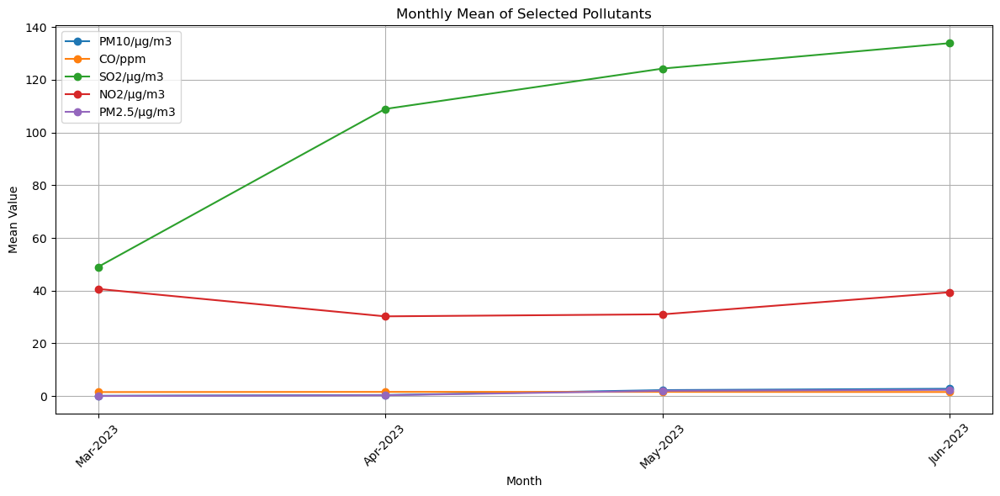

In [129]:
params = ['PM10/µg/m3', 'CO/ppm', 'SO2/µg/m3', 'NO2/µg/m3', 'PM2.5/µg/m3']
x = df3_monthly_means['Month']

plt.figure(figsize=(12, 6))

for param in params:
    plt.plot(x, df3_monthly_means[param], marker='o', label=param)

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Selected Pollutants')
plt.legend()
plt.grid(True)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## One-room-apartment

In [130]:
df4_air_pollution = pd.read_csv("../data/2023_Indoor_Air_Quality_Dataset_Germany/one_room_apartement.csv")

In [131]:
df4_air_pollution.head()

,TypPS,oxygen,pm10,cnt0_5,co,temperature,performance,co2,measuretime,so2,...,health,temperature_o2,cnt2_5,o3,humidity,dHdt,humidity_abs,sound,pm2_5,cnt0_3
0,1.995,20.863,6.004,273.935,1.726,23.718,805.0,490.458,1868,518.956,...,758.0,27.774,0.923,26.690,60.385,0.04,12.983,51.839,5.402,859.499
1,1.689,20.863,6.891,296.490,1.726,23.715,806.0,490.505,1867,520.396,...,715.0,27.762,0.739,26.594,60.377,0.03,12.980,52.092,6.451,932.282
2,2.854,20.863,7.486,268.740,1.726,23.716,808.0,489.080,1857,520.139,...,742.0,27.764,3.002,26.501,60.358,0.00,12.977,51.313,6.107,851.850
3,1.635,20.862,5.874,262.821,1.726,23.719,807.0,488.189,1881,518.782,...,746.0,27.748,1.287,26.611,60.426,0.03,12.993,53.420,5.489,829.355
4,1.579,20.864,7.068,297.597,1.725,23.712,809.0,485.401,1880,516.398,...,717.0,27.760,0.527,26.681,60.435,0.03,12.990,52.284,6.723,926.864


In [132]:
df4_air_pollution.drop(columns=['TypPS', "oxygen", "cnt0_5", "performance", "cnt5", "cnt1", "dewpt", "cnt10", "dCO2dt", "sound_max", "temperature_o2", "cnt2_5", "dHdt", "humidity_abs", "sound", "cnt0_3", "measuretime"], inplace=True)

In [133]:
df4_air_pollution.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12446 entries, 0 to 12445
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   pm10         12446 non-null  float64
 1   co           12446 non-null  float64
 2   temperature  12446 non-null  float64
 3   co2          12446 non-null  float64
 4   so2          12446 non-null  float64
 5   no2          12446 non-null  float64
 6   timestamp    12446 non-null  object 
 7   pm1          12446 non-null  float64
 8   tvoc         12446 non-null  float64
 9   pressure     12446 non-null  float64
 10  health       12446 non-null  float64
 11  o3           12446 non-null  float64
 12  humidity     12446 non-null  float64
 13  pm2_5        12446 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.3+ MB


In [134]:
df4_air_pollution.rename(columns={
    "pm10": "PM10/µg/m3",
    "co": "CO/ppm",
    "temperature": "Temperature/°C",
    "co2": "CO2/ppm",
    "so2": "SO2/µg/m3",
    "no2": "NO2/µg/m3",
    "timestamp": "timestamp",
    "pm1": "PM1/µg/m3",
    "tvoc": "TVOC/ppb",
    "pressure" : "Pressure/hPa",
    "health": "Health index",
    "o3": "O3/µg/m3",
    "humidity": "Humidity/%",
    "pm2_5": "PM2.5/µg/m3"
}, inplace=True)

In [135]:
# convert 'timestamp' to datetime type with the correct format
df4_air_pollution['timestamp'] = pd.to_datetime(df4_air_pollution['timestamp'], format="%Y-%m-%d %H:%M:%S")

# create new columns for date and time
df4_air_pollution['date'] = df4_air_pollution['timestamp'].dt.date
df4_air_pollution['time'] = df4_air_pollution['timestamp'].dt.time

# drop original Date column and reorder
df4_air_pollution.drop(columns=['timestamp'], inplace=True)
df4_air_pollution.insert(0, 'time', df4_air_pollution.pop('time'))
df4_air_pollution.insert(0, 'date', df4_air_pollution.pop('date'))

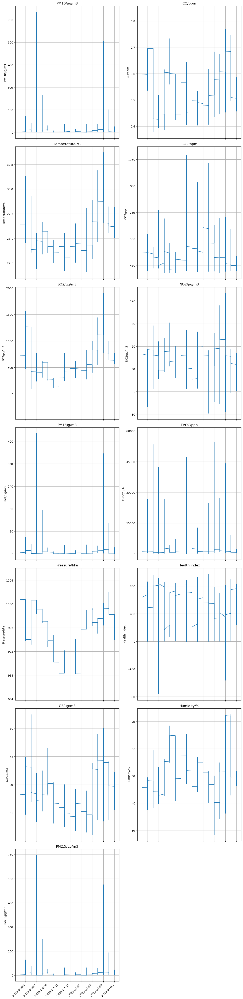

In [136]:
# columns to plot (all measurements)
measurements = [
    'PM10/µg/m3', 'CO/ppm', 'Temperature/°C', 'CO2/ppm',
    'SO2/µg/m3', 'NO2/µg/m3', 'PM1/µg/m3', 'TVOC/ppb', 'Pressure/hPa',
    'Health index', 'O3/µg/m3', 'Humidity/%', 'PM2.5/µg/m3'
]

n = len(measurements)
cols = 2
rows = (n + cols - 1) // cols  # calculate rows needed

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*7), sharex=True)
axes = axes.flatten()

for i, meas in enumerate(measurements):
    axes[i].plot(df4_air_pollution['date'], df4_air_pollution[meas])
    axes[i].set_title(meas)
    axes[i].set_ylabel(meas)
    axes[i].grid(True)

    # set max ~6 y-ticks
    axes[i].yaxis.set_major_locator(MaxNLocator(nbins=6))

# remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


# rotate x-axis labels
for ax in axes:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [137]:
# calculate the average of each pollutant per month (to decrease the density of the data)

# ensure the Date column is datetime
df4_air_pollution['date'] = pd.to_datetime(df4_air_pollution['date'])

# create a month column
df4_air_pollution['Month'] = df4_air_pollution['date'].dt.to_period('M')  # Gives '2025-06' format

# group by month and calculate mean of all other columns
monthly_means = df4_air_pollution.groupby('Month').mean(numeric_only=True).reset_index()

In [138]:
# convert Period to Timestamp (start of the period)
monthly_means['Month'] = monthly_means['Month'].dt.to_timestamp()
df4_monthly_means = monthly_means.reset_index(drop=True)

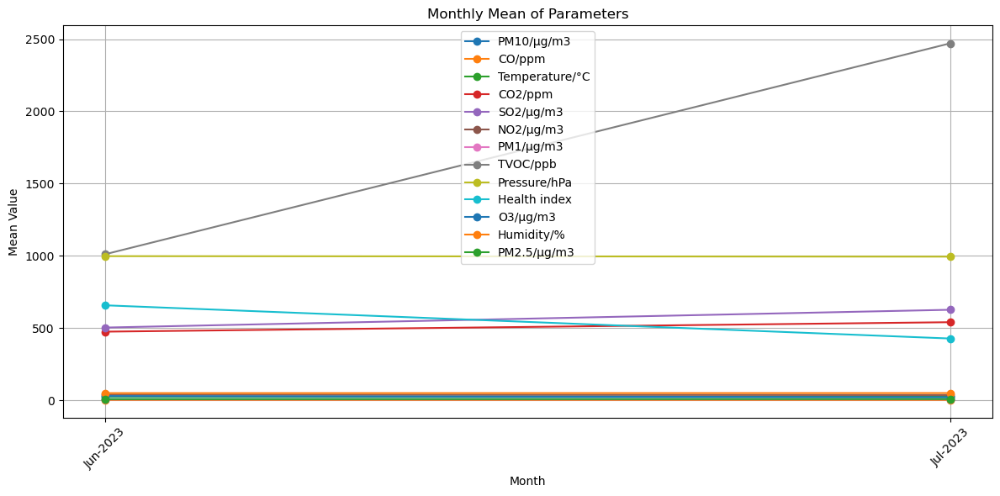

In [139]:
plt.figure(figsize=(12, 6))

for column in df4_monthly_means.columns:
    if column != 'Month':  # skip the Month column
        # plot each parameter's monthly mean
        plt.plot(df4_monthly_means['Month'], df4_monthly_means[column], marker='o', label=column)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Parameters')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

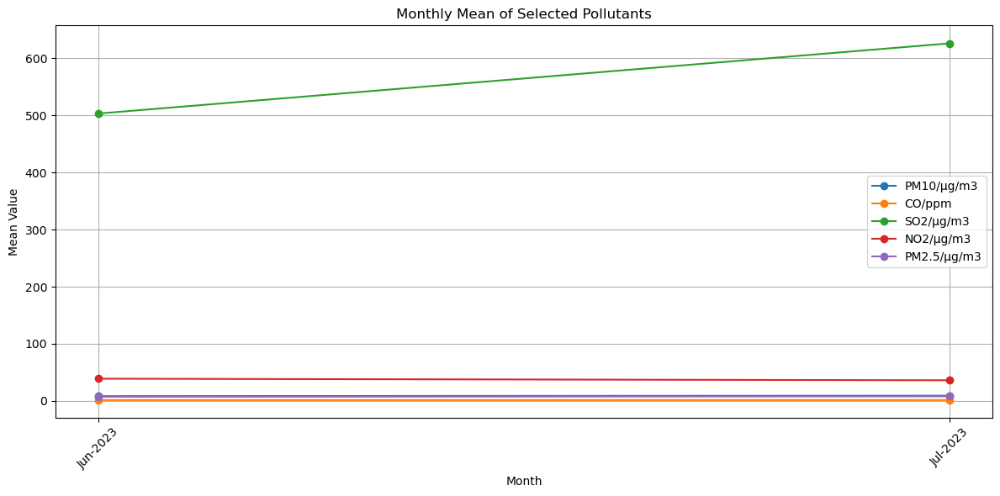

In [140]:
params = ['PM10/µg/m3', 'CO/ppm', 'SO2/µg/m3', 'NO2/µg/m3', 'PM2.5/µg/m3']
x = df4_monthly_means['Month']

plt.figure(figsize=(12, 6))

for param in params:
    plt.plot(x, df4_monthly_means[param], marker='o', label=param)

plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('Monthly Mean of Selected Pollutants')
plt.legend()
plt.grid(True)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## Air pollutants

In [141]:
df1_monthly_means = df1_monthly_means.drop(columns=['Temperature [°C]', 'Pressure [hPa]', 'Humidity [RH]'])
df2_monthly_means = df2_monthly_means.drop(columns=['Temperature/°C', 'Humidity (%)', 'Light Intensity (lux)'])
df3_monthly_means = df3_monthly_means.drop(columns=['Temperature/°C', 'Pressure/hPa', 'Health index', 'Humidity/%'])
df4_monthly_means = df4_monthly_means.drop(columns=['Temperature/°C', 'Pressure/hPa', 'Health index', 'Humidity/%'])

In [142]:
df1_monthly_means = df1_monthly_means.rename(columns={"PM2.5 [ug/m3]": "PM2.5 [µg/m3]"})
df2_monthly_means = df2_monthly_means.rename(columns={
    "CO2 (ppm)": "CO2 [ppm]",
    "PM2.5/µg/m3": "PM2.5 [µg/m3]",
    "PM10/µg/m3": "PM10 [µg/m3]",
    "TVOC (ppb)": "TVOC [ppb]",
    "CO (ppm)": "CO [ppm]"
})
df3_monthly_means = df3_monthly_means.rename(columns={
    "PM10/µg/m3": "PM10 [µg/m3]",
    "CO/ppm": "CO [ppm]",
    "CO2/ppm": "CO2 [ppm]",
    "SO2/µg/m3": "SO2 [µg/m3]",
    "NO2/µg/m3": "NO2 [µg/m3]",
    "PM1/µg/m3": "PM1 [µg/m3]",
    "TVOC/ppb": "TVOC [ppb]",
    "O3/µg/m3": "O3 [µg/m3]",
    "PM2.5/µg/m3": "PM2.5 [µg/m3]"
})
df4_monthly_means = df4_monthly_means.rename(columns={
    "PM10/µg/m3": "PM10 [µg/m3]",
    "CO/ppm": "CO [ppm]",
    "CO2/ppm": "CO2 [ppm]",
    "SO2/µg/m3": "SO2 [µg/m3]",
    "NO2/µg/m3": "NO2 [µg/m3]",
    "PM1/µg/m3": "PM1 [µg/m3]",
    "TVOC/ppb": "TVOC [ppb]",
    "O3/µg/m3": "O3 [µg/m3]",
    "PM2.5/µg/m3": "PM2.5 [µg/m3]"
})

In [143]:
# function to convert µg/m³ to ppm (for NO2 and SO2), to ppb (for O3)
def ugm3_to_ppm(conc_ugm3, molar_mass, temp_C=25, pressure_Pa=101325):
    R = 8.314  # J/(mol·K)
    T = temp_C + 273.15  # Kelvin
    ppm = (conc_ugm3 * R * T) / (pressure_Pa * molar_mass) * 1e-3
    return ppm

def ugm3_to_ppb(conc_ugm3, molar_mass, temp_C=25, pressure_Pa=101325):
    ppm = ugm3_to_ppm(conc_ugm3, molar_mass, temp_C, pressure_Pa)
    return ppm * 1000

# convert and rename columns in df3_monthly_means
if 'NO2 [µg/m3]' in df3_monthly_means.columns:
    df3_monthly_means['NO2 [ppm]'] = ugm3_to_ppm(df3_monthly_means['NO2 [µg/m3]'], 46.01)
    df3_monthly_means.drop(columns=['NO2 [µg/m3]'], inplace=True)

if 'SO2 [µg/m3]' in df3_monthly_means.columns:
    df3_monthly_means['SO2 [ppm]'] = ugm3_to_ppm(df3_monthly_means['SO2 [µg/m3]'], 64.07)
    df3_monthly_means.drop(columns=['SO2 [µg/m3]'], inplace=True)

if 'O3 [µg/m3]' in df3_monthly_means.columns:
    df3_monthly_means['O3 [ppb]'] = ugm3_to_ppb(df3_monthly_means['O3 [µg/m3]'], 48.00)
    df3_monthly_means.drop(columns=['O3 [µg/m3]'], inplace=True)

# convert and rename columns in df4_monthly_means
if 'NO2 [µg/m3]' in df4_monthly_means.columns:
    df4_monthly_means['NO2 [ppm]'] = ugm3_to_ppm(df4_monthly_means['NO2 [µg/m3]'], 46.01)
    df4_monthly_means.drop(columns=['NO2 [µg/m3]'], inplace=True)

if 'SO2 [µg/m3]' in df4_monthly_means.columns:
    df4_monthly_means['SO2 [ppm]'] = ugm3_to_ppm(df4_monthly_means['SO2 [µg/m3]'], 64.07)
    df4_monthly_means.drop(columns=['SO2 [µg/m3]'], inplace=True)

if 'O3 [µg/m3]' in df4_monthly_means.columns:
    df4_monthly_means['O3 [ppb]'] = ugm3_to_ppb(df4_monthly_means['O3 [µg/m3]'], 48.00)
    df4_monthly_means.drop(columns=['O3 [µg/m3]'], inplace=True)

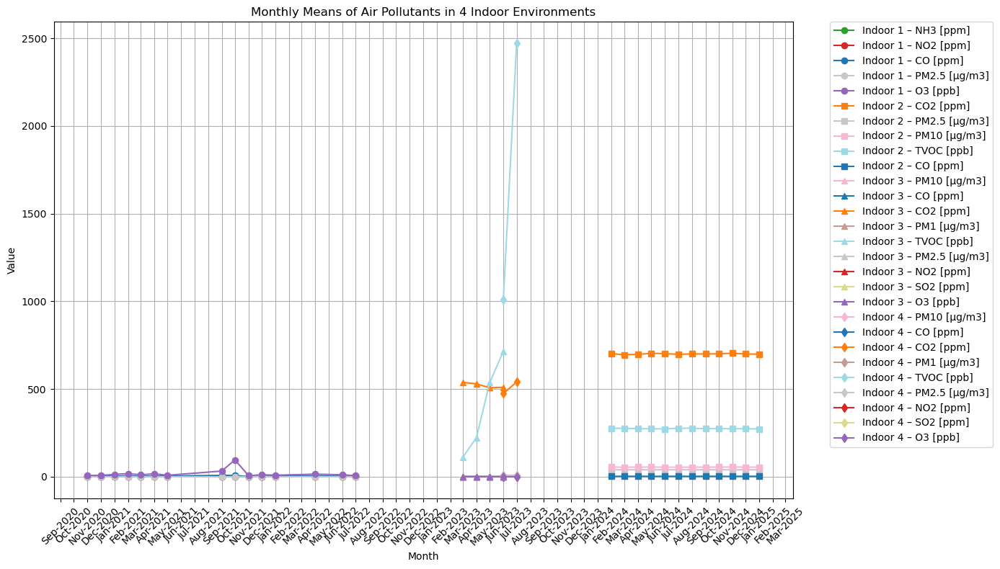

In [144]:
import numpy as np

# define datasets and labels
datasets = [df1_monthly_means, df2_monthly_means, df3_monthly_means, df4_monthly_means]
dataset_labels = ['Indoor 1', 'Indoor 2', 'Indoor 3', 'Indoor 4']
markers = ['o', 's', '^', 'd']

# get all unique pollutant columns across all datasets
all_pollutants = set()
for df in datasets:
    all_pollutants.update(df.columns)
all_pollutants.discard('Month')
all_pollutants = sorted(all_pollutants)  # keep consistent order

# assign a color to each pollutant using a continuous scale
cmap = plt.colormaps.get_cmap('tab20')
color_positions = np.linspace(0, 1, len(all_pollutants))
color_map = {pollutant: cmap(pos) for pollutant, pos in zip(all_pollutants, color_positions)}

# plot
plt.figure(figsize=(14, 8))

for i, df in enumerate(datasets):
    for pollutant in df.columns:
        if pollutant == 'Month':
            continue
        plt.plot(
            df['Month'], df[pollutant],
            label=f'{dataset_labels[i]} – {pollutant}',
            marker=markers[i],
            color=color_map[pollutant]
        )

# format x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

plt.xlabel('Month')
plt.ylabel('Value')
plt.title('Monthly Means of Air Pollutants in 4 Indoor Environments')
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

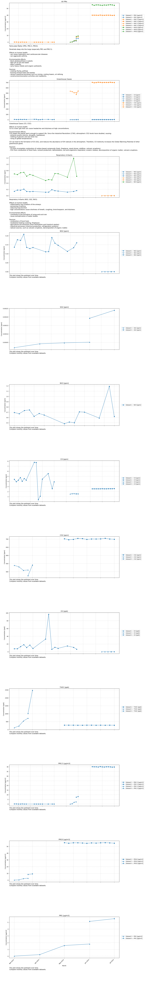

In [145]:
# define datasets and labels
datasets = [df1_monthly_means, df2_monthly_means, df3_monthly_means, df4_monthly_means]
dataset_labels = ['Dataset 1', 'Dataset 2', 'Dataset 3', 'Dataset 4']
markers = ['o', 's', '^', 'd']

# define pollutants grouped by unit
pollutants_by_unit = {
    'ppm': ['NO2 [ppm]', 'SO2 [ppm]', 'NH3 [ppm]', 'CO [ppm]', 'CO2 [ppm]'],
    'ppb': ['O3 [ppb]', 'TVOC [ppb]'],
    'µg/m3': ['PM2.5 [µg/m3]', 'PM10 [µg/m3]', 'PM1 [µg/m3]']
}

# define special groups with multiple pollutants plotted together
special_groups = {
    'All PMs': ['PM1 [µg/m3]', 'PM2.5 [µg/m3]', 'PM10 [µg/m3]'],
    'Greenhouse Gases': ['CO [ppm]', 'CO2 [ppm]'],
    'Respiratory Irritants': ['NO2 [ppm]', 'SO2 [ppm]', 'NH3 [ppm]']
}

# define texts for special groups
special_info_texts = {
    'All PMs': (
        "Particulate Matter (PM1, PM2.5, PM10):\n\n"
        "Penetrate deep into the lungs (especially PM1 and PM2.5).\n\n"
        "Effects on human health:\n"
        "- can cause respiratory and cardiovascular diseases\n"
        "- can aggravate asthma.\n\n"
        "Environmental effects:\n"
        "- block photosynthesis in plants\n"
        "- alter pH of soil and water\n"
        "- affect visibility\n"
        "- carry heavy metals and organic pollutants.\n\n"
        "Sources:\n"
        "- cooking (frying, grilling)\n"
        "- burning of fossil fuels and wastes\n"
        "- various industrial processes such as mining, cooling towers, oil refining\n"
        "- construction/renovation activities and roadworks."
    ),
    'Greenhouse Gases': (
        "Greenhouse Gases (CO, CO2):\n\n"
        "Effects on human health:\n"
        "CO is a toxic gas that can cause headaches and dizziness at high concentrations.\n\n"
        "Environmental effects:\n"
        "CO2 keeps the planet warm enough to support life. Since the Industrial Revolution (1760), "
        "atmospheric CO2 levels have doubled, causing:\n"
        "- extreme events (storms, droughts, heatwaves)\n"
        "- melting of glaciers and sea level rise\n"
        "- rising of global temperatures.\n\n"
        "CO can lead to the formation of O3 (GG), and reduces the abundance of OH radicals in the atmosphere. "
        "Therefore, CO indirectly increases the Global Warming Potential of other greenhouse gases.\n\n"
        "Sources:\n"
        "- CO from incomplete combustion of carbon-based compounds (fuels, fireplaces, wood stoves, wildfires, volcanic eruptions).\n"
        "- CO2 from combustion of fossil fuels, cement production, deforestation, soil and organisms respiration, oceanic release, decomposition of organic matter, volcanic eruptions."
    ),
    'Respiratory Irritants': (
        "Respiratory Irritants (NO2, SO2, NH3):\n\n"
        "Effects on human health:\n"
        "- inflammation and irritation of the airways\n"
        "- worsening of asthma\n"
        "- reducing lung function\n"
        "- high concentrations cause shortness of breath, coughing, bronchospasm, and dizziness.\n\n"
        "Environmental effects:\n"
        "- contribute to the formation of smog and acid rain\n"
        "- cause eutrophication of water bodies.\n\n"
        "Sources:\n"
        "- combustion of fossil fuels\n"
        "- residential heating (cooking, fireplaces)\n"
        "- agricultural soil emissions (from fertilization and livestock wastes)\n"
        "- industrial processes (chemical production, refrigeration systems)\n"
        "- natural sources, such as volcanic eruptions, decomposition of organic matter."
    )
}

# define info text for single pollutants
generic_info_text = (
    "This plot shows the pollutant over time.\n"
    "Compare monthly values from available datasets.\n"
)

# flatten all pollutants for single pollutant plots (include ALL)
single_pollutants = sum(pollutants_by_unit.values(), [])

# organize plots: first groups, then all single pollutants
plots_to_make = []

for group_name, group_pollutants in special_groups.items():
    plots_to_make.append({
        'name': group_name,
        'pollutants': group_pollutants,
        'info': special_info_texts[group_name]
    })

for pol in single_pollutants:
    plots_to_make.append({
        'name': pol,
        'pollutants': [pol],
        'info': generic_info_text
    })

def get_ylabel(pollutant):
    if '[' in pollutant and ']' in pollutant:
        return f"Concentration [{pollutant.split('[')[1].split(']')[0]}]"
    else:
        return "Concentration"

def plot_all_stacked():
    n = len(plots_to_make)
    fig_height = 8 * n  # increased height per plot
    fig = plt.figure(figsize=(15, fig_height), constrained_layout=True)
    gs = fig.add_gridspec(n * 2, 1, height_ratios=[4, 3] * n)  # plot + text with better balance

    cmap = plt.colormaps.get_cmap('tab10')

    for i, plot in enumerate(plots_to_make):
        ax = fig.add_subplot(gs[2 * i, 0])
        for j, pol in enumerate(plot['pollutants']):
            for k, df in enumerate(datasets):
                if pol in df.columns:
                    ax.plot(df['Month'], df[pol], marker=markers[k], label=f'{dataset_labels[k]} – {pol}', color=cmap(j))

        ylabel = get_ylabel(plot['pollutants'][0])
        ax.set_ylabel(ylabel)
        ax.set_title(plot['name'])
        ax.grid(True, linestyle='--', alpha=0.7)

        # legend outside plot
        ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), borderaxespad=0.)

        if i == n - 1:
            ax.set_xlabel('Month')
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
            ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
            plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
        else:
            ax.tick_params(labelbottom=False)

        # info text below plot
        info_ax = fig.add_subplot(gs[2 * i + 1, 0])
        info_ax.axis('off')
        info_ax.text(0, 1, plot['info'], ha='left', va='top', fontsize=11, wrap=True)

    plt.show()

# run plotting function
plot_all_stacked()

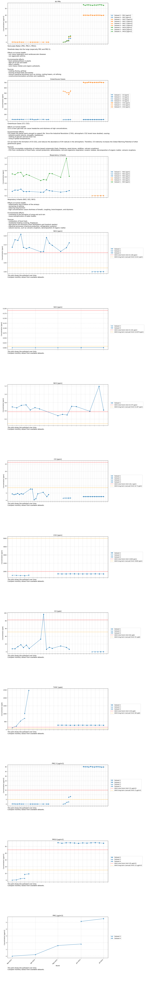

In [146]:
# WHO limits in the same units the data
who_limits = {
    'NO2 [ppm]': [0.106, 0.021],      # short-term (1h), long-term (annual)
    'SO2 [ppm]': [0.191, 0.0076],
    'NH3 [ppm]': [0.575, 0.287],
    'CO [ppm]': [26.2, 8.73],
    'CO2 [ppm]': [1000, 5000],
    'O3 [ppb]': [82, 51],
    'TVOC [ppb]': [150, 60],
    'PM2.5 [µg/m3]': [15, 5],
    'PM10 [µg/m3]': [45, 15],
    'PM1 [µg/m3]': []  # No WHO guideline
}

def plot_all_stacked_with_who_guidelines():
    n = len(plots_to_make)
    fig_height = 8 * n  # height per plot + text
    fig = plt.figure(figsize=(15, fig_height), constrained_layout=True)
    gs = fig.add_gridspec(n * 2, 1, height_ratios=[4, 3] * n)

    cmap = plt.colormaps.get_cmap('tab10')

    for i, plot in enumerate(plots_to_make):
        ax = fig.add_subplot(gs[2 * i, 0])
        pollutants = plot['pollutants']

        for j, pol in enumerate(pollutants):
            for k, df in enumerate(datasets):
                if pol in df.columns:
                    label = f'{dataset_labels[k]} – {pol}' if len(pollutants) > 1 else dataset_labels[k]
                    ax.plot(df['Month'], df[pol], marker=markers[k], label=label, color=cmap(j))

        # WHO limit lines (only for single-pollutant plots)
        if len(pollutants) == 1 and pollutants[0] in who_limits and who_limits[pollutants[0]]:
            limits = who_limits[pollutants[0]]
            colors = ['red', 'orange']
            labels = ['WHO short-term limit', 'WHO long-term (annual) limit']
            unit = pollutants[0][pollutants[0].find('[')+1 : pollutants[0].find(']')]
            for idx, val in enumerate(limits):
                ax.axhline(y=val, color=colors[idx], linestyle='--', linewidth=1.5,
                           label=f'{labels[idx]} ({val} {unit})')

        # y-axis label
        ylabel = get_ylabel(pollutants[0])
        ax.set_ylabel(ylabel)

        # x-axis formatting
        ax.set_title(plot['name'])
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

        # only show x-label on last plot
        if i == n - 1:
            ax.set_xlabel('Month')
        else:
            ax.tick_params(labelbottom=False)

        # legend outside
        ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), borderaxespad=0.)

        # info text subplot
        info_ax = fig.add_subplot(gs[2 * i + 1, 0])
        info_ax.axis('off')
        info_ax.text(0, 1, plot['info'], ha='left', va='top', fontsize=11, wrap=True)

    plt.show()

plot_all_stacked_with_who_guidelines()

## Removal of air pollutants (PM)

"For the experimental work six rooms were selected for assessment of indoor
air quality of a specific plants was kept in each different rooms i.e.R1 (spider plant), R2 (rubber
plant), R3 (bamboo palm), R4 (snake plant), R5 (boston fern) and one room was RC (control
room) for comparison in air quality."

Reference: Assessment of Indoor Air pollution through use of Indoor Plants, 2022. DOI:10.37745/ijepr.13/vol10n43351.

In [147]:
df_PM_removal = pd.read_excel("../data/PM_plant_removal.xlsx")

In [148]:
# choose columns to keep
cols_to_keep = ['No. Plants', 'Day']

# find all columns ending with '_A' to keep (including Control room_A)
percent_cols = [col for col in df_PM_removal.columns if col.endswith('_A')]

# combine
cols_to_keep.extend(percent_cols)

# create a new dataframe with only those columns
df_PM_removal = df_PM_removal[cols_to_keep]

# rename columns to remove '_C' suffix
df_PM_removal.columns = [col.replace('_A', ' [µm/m3]') for col in df_PM_removal.columns]

# convert to numeric, coercing errors to NaN
df_PM_removal = df_PM_removal.apply(pd.to_numeric, errors='coerce')

In [149]:
# sort and reset the Day index to be sequential
df_sorted = df_PM_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)  # ensures days go 1,2,...28

control_col = "Control room [µm/m3]"

# identify plant columns (exclude metadata and control)
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate difference: plant PM - control PM (day-wise)
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)

# sum of differences per plant (over all days)
sum_diff_per_plant = diff_df.sum(axis=0)

# total PM in control room over all days
total_control_pm = df_sorted[control_col].sum()

# calculate percent decrease (make negative differences positive)
percent_decrease_per_plant = (-sum_diff_per_plant / total_control_pm) * 100

print(percent_decrease_per_plant)

Spider plant [µm/m3]    33.758006
Rubber plant [µm/m3]    31.490660
Bamboo plant [µm/m3]    28.950679
Snake plant [µm/m3]     28.767043
Boston fern [µm/m3]     29.767452
dtype: float64


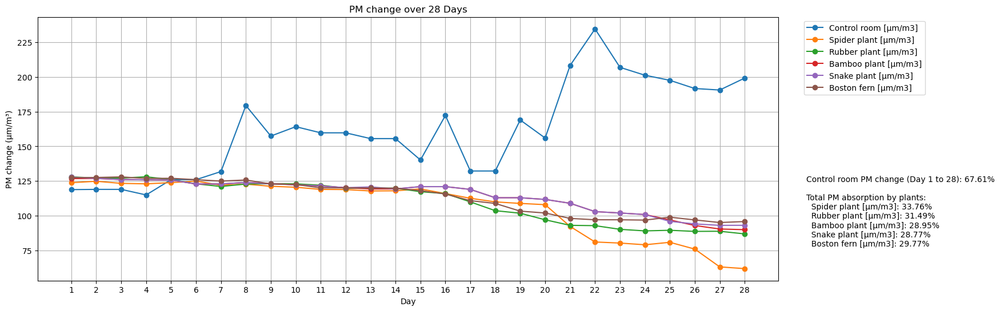

In [150]:
import matplotlib.gridspec as gridspec

# sort data by Day
df_sorted = df_PM_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)  # ensure sequential days 1-28

control_col = "Control room [µm/m3]"

# calculate percent increase in control room PM from day 1 to day 28
pm_day1 = df_sorted.loc[df_sorted["Day"] == 1, control_col].values[0]
pm_day28 = df_sorted.loc[df_sorted["Day"] == 28, control_col].values[0]
percent_increase_control = ((pm_day28 - pm_day1) / pm_day1) * 100

# identify plant columns (exclude metadata and control)
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate difference: plant PM - control PM (day-wise)
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)

# sum of differences per plant (over all days)
sum_diff_per_plant = diff_df.sum(axis=0)

# total PM in control room over all days
total_control_pm = df_sorted[control_col].sum()

# calculate total absorption (%) per plant
total_absorption = (-sum_diff_per_plant / total_control_pm) * 100

# create figure with adjusted width ratios
fig = plt.figure(figsize=(20, 6))
spec = gridspec.GridSpec(ncols=2, nrows=1, width_ratios=[6, 1])  # more space to main plot

# plot
ax = fig.add_subplot(spec[0])

for col in df_sorted.columns:
    if col in ["No. Plants", "Day", "Week"]:
        continue
    y = df_sorted[col]
    ax.plot(df_sorted["Day"], y, marker='o', label=col.replace(" [%]", ""))

ax.set_xlabel("Day")
ax.set_ylabel("PM change (µm/m³)")
ax.set_title("PM change over 28 Days")
ax.grid(True)
ax.set_xticks(range(1, 29))

# legend and text
ax_legend = fig.add_subplot(spec[1])
ax_legend.axis("off")

handles, labels = ax.get_legend_handles_labels()
ax_legend.legend(handles, labels, loc='upper left', bbox_to_anchor=(0, 1))  # nudge legend left

# text with calculated values below the legend, moved a bit to the right inside the axes
text_str = (
    f"Control room PM change (Day 1 to 28): {percent_increase_control:.2f}%\n\n"
    "Total PM absorption by plants:\n"
)
for plant, total_abs in total_absorption.items():
    text_str += f"  {plant.replace(' [%]', '')}: {total_abs:.2f}%\n"

ax_legend.text(
    0.05, 0.4,  # slightly moved right inside the axes
    text_str,
    fontsize=10,
    va='top',
    ha='left',
    wrap=True,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)

# reduce horizontal spacing between subplots
plt.subplots_adjust(wspace=0.05)

plt.show()

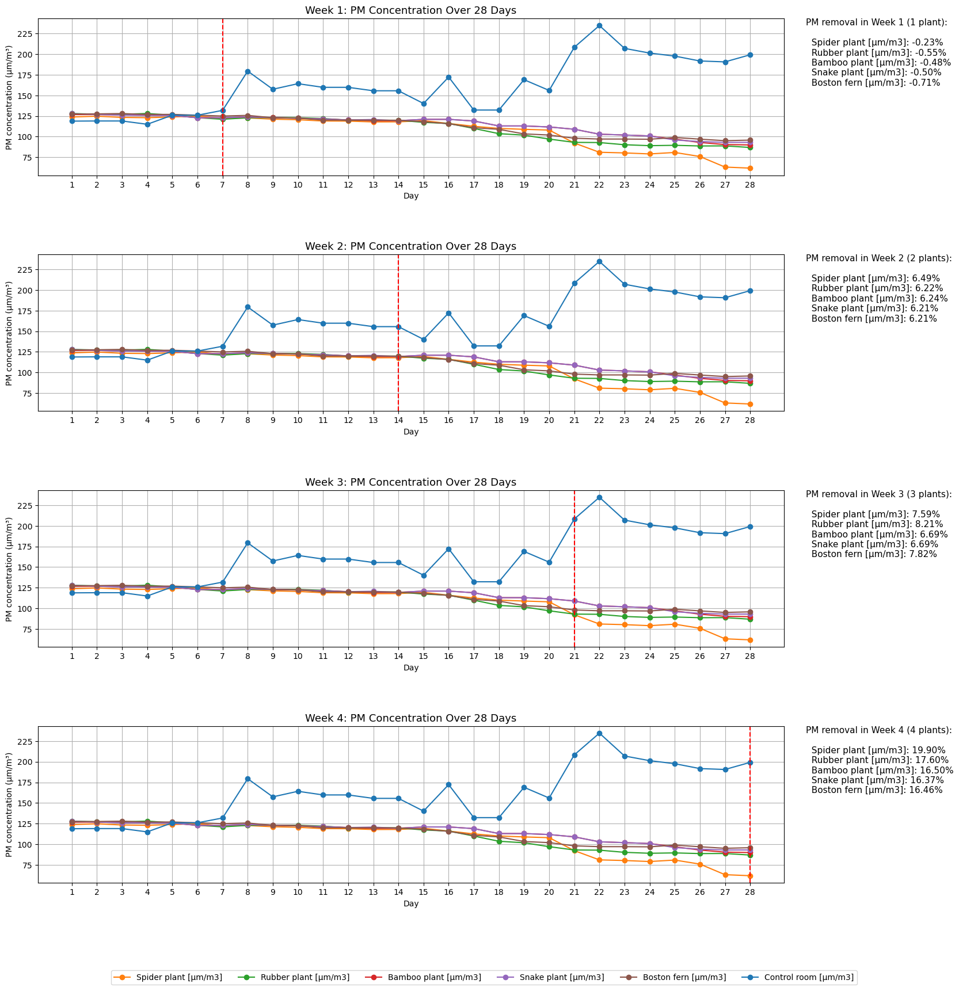

In [151]:
# sort data by Day
df_sorted = df_PM_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)

control_col = "Control room [µm/m3]"
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate differences for later percentage display
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)
total_control_pm = df_sorted[control_col].sum()

# set up color mapping from original plot
fig_temp, ax_temp = plt.subplots()
line_colors = {}

for col in df_sorted.columns:
    if col in ["No. Plants", "Day", "Week"]:
        continue
    line = ax_temp.plot(df_sorted["Day"], df_sorted[col], label=col)[0]
    line_colors[col] = line.get_color()

plt.close(fig_temp)  # we just needed the colors

def plot_static_weeks_stacked():
    fig = plt.figure(figsize=(20, 22))
    gs = fig.add_gridspec(nrows=5, ncols=2, width_ratios=[6, 1], height_ratios=[1, 1, 1, 1, 0.2], hspace=0.6, wspace=0.05)

    legend_handles = []
    legend_labels = []

    for i in range(4):
        week = i + 1
        ax = fig.add_subplot(gs[i, 0])
        ax_text = fig.add_subplot(gs[i, 1])
        ax_text.axis("off")

        for col in plant_cols + [control_col]:
            line, = ax.plot(
                df_sorted["Day"], 
                df_sorted[col], 
                marker='o', 
                label=col.replace(" [%]", ""),
                color=line_colors[col]
            )

            if i == 0:  # only collect handles once
                legend_handles.append(line)
                legend_labels.append(col.replace(" [%]", ""))

        ax.axvline(x=week * 7, color='red', linestyle='--', linewidth=1.5, label=f'Week {week} divider')
        ax.set_title(f"Week {week}: PM Concentration Over 28 Days", fontsize=13)
        ax.set_xlabel("Day")
        ax.set_ylabel("PM concentration (µm/m³)")
        ax.set_xticks(range(1, 29))
        ax.grid(True)

        # info text
        start_day = (week - 1) * 7
        end_day = start_day + 7
        selected_diff = diff_df.iloc[start_day:end_day]
        week_total_removal = (-selected_diff.sum() / total_control_pm) * 100
        num_plants = week

        text_str = f"PM removal in Week {week} ({num_plants} plant{'s' if num_plants > 1 else ''}):\n\n"
        for plant, removal in week_total_removal.items():
            text_str += f"  {plant.replace(' [%]', '')}: {removal:.2f}%\n"

        ax_text.text(
            0, 1, text_str,
            fontsize=11,
            va='top',
            ha='left',
            wrap=True,
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )

    # add common legend to bottom row
    ax_legend = fig.add_subplot(gs[4, :])
    ax_legend.axis("off")
    ax_legend.legend(
        handles=legend_handles,
        labels=legend_labels,
        loc='center',
        ncol=len(legend_handles),
        fontsize=10
    )

    plt.show()

plot_static_weeks_stacked()

## Removal or air pollutants (formaldehyde, example of VOC)

For the experimental work six rooms were selected for assessment of indoor
air quality of a specific plants was kept in each different rooms i.e.R1 (spider plant), R2 (rubber
plant), R3 (bamboo palm), R4 (snake plant), R5 (boston fern) and one room was RC (control
room) for comparison in air quality.

In [152]:
df_fm_removal = pd.read_excel("../data/formaldeide_plant_removal.xlsx")

In [153]:
# rename columns
df_fm_removal.columns = [col.replace('_A', ' [mg/m3]') for col in df_fm_removal.columns]

# convert to numeric, coercing errors to NaN
df_fm_removal = df_fm_removal.apply(pd.to_numeric, errors='coerce')

In [154]:
# sort and reset the Day index to be sequential
df_sorted = df_fm_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)  # ensures days go 1,2,...28

control_col = "Control room [mg/m3]"

# identify plant columns (exclude metadata and control)
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate difference: plant fm - control fm (day-wise)
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)

# sum of differences per plant (over all days)
sum_diff_per_plant = diff_df.sum(axis=0)

# total fm in control room over all days
total_control_pm = df_sorted[control_col].sum()

# calculate percent decrease (make negative differences positive)
percent_decrease_per_plant = (-sum_diff_per_plant / total_control_pm) * 100

print(percent_decrease_per_plant)

Spider plant [mg/m3]    59.422492
Rubber plant [mg/m3]    48.480243
Bamboo plant [mg/m3]    62.462006
Snake plant [mg/m3]     53.647416
Boston fern [mg/m3]     52.887538
dtype: float64


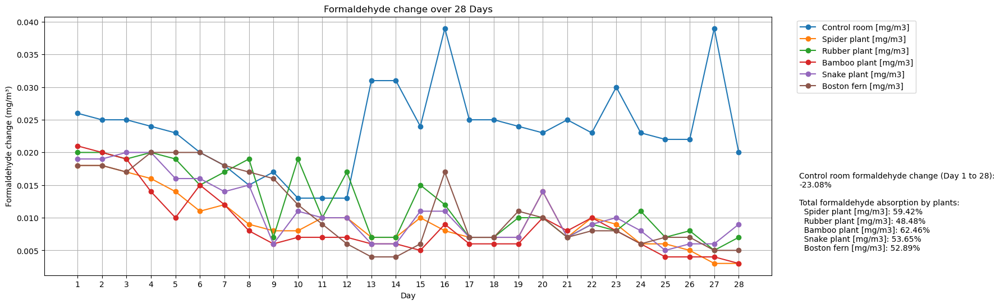

In [155]:
# sort data by Day
df_sorted = df_fm_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)  # ensure sequential days 1-28

control_col = "Control room [mg/m3]"

# calculate percent increase in control room PM from day 1 to day 28
pm_day1 = df_sorted.loc[df_sorted["Day"] == 1, control_col].values[0]
pm_day28 = df_sorted.loc[df_sorted["Day"] == 28, control_col].values[0]
percent_increase_control = ((pm_day28 - pm_day1) / pm_day1) * 100

# identify plant columns (exclude metadata and control)
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate difference: plant PM - control PM (day-wise)
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)

# sum of differences per plant (over all days)
sum_diff_per_plant = diff_df.sum(axis=0)

# total PM in control room over all days
total_control_pm = df_sorted[control_col].sum()

# calculate total absorption (%) per plant
total_absorption = (-sum_diff_per_plant / total_control_pm) * 100

# create figure with adjusted width ratios
fig = plt.figure(figsize=(20, 6))
spec = gridspec.GridSpec(ncols=2, nrows=1, width_ratios=[6, 1])  # more space to main plot

# plot
ax = fig.add_subplot(spec[0])

for col in df_sorted.columns:
    if col in ["No. Plants", "Day", "Week"]:
        continue
    y = df_sorted[col]
    ax.plot(df_sorted["Day"], y, marker='o', label=col.replace(" [%]", ""))

ax.set_xlabel("Day")
ax.set_ylabel("Formaldehyde change (mg/m³)")
ax.set_title("Formaldehyde change over 28 Days")
ax.grid(True)
ax.set_xticks(range(1, 29))

# legend and text panel
ax_legend = fig.add_subplot(spec[1])
ax_legend.axis("off")

handles, labels = ax.get_legend_handles_labels()
ax_legend.legend(handles, labels, loc='upper left', bbox_to_anchor=(0, 1))  # move legend to the left

# text with calculated values below the legend, moved to the right right a bit inside axes
text_str = (
    f"Control room formaldehyde change (Day 1 to 28): {percent_increase_control:.2f}%\n\n"
    "Total formaldehyde absorption by plants:\n"
)
for plant, total_abs in total_absorption.items():
    text_str += f"  {plant.replace(' [%]', '')}: {total_abs:.2f}%\n"

ax_legend.text(
    0.05, 0.4,  # slightly moved right inside the axes
    text_str,
    fontsize=10,
    va='top',
    ha='left',
    wrap=True,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)

# reduce horizontal spacing between subplots
plt.subplots_adjust(wspace=0.05)

plt.show()

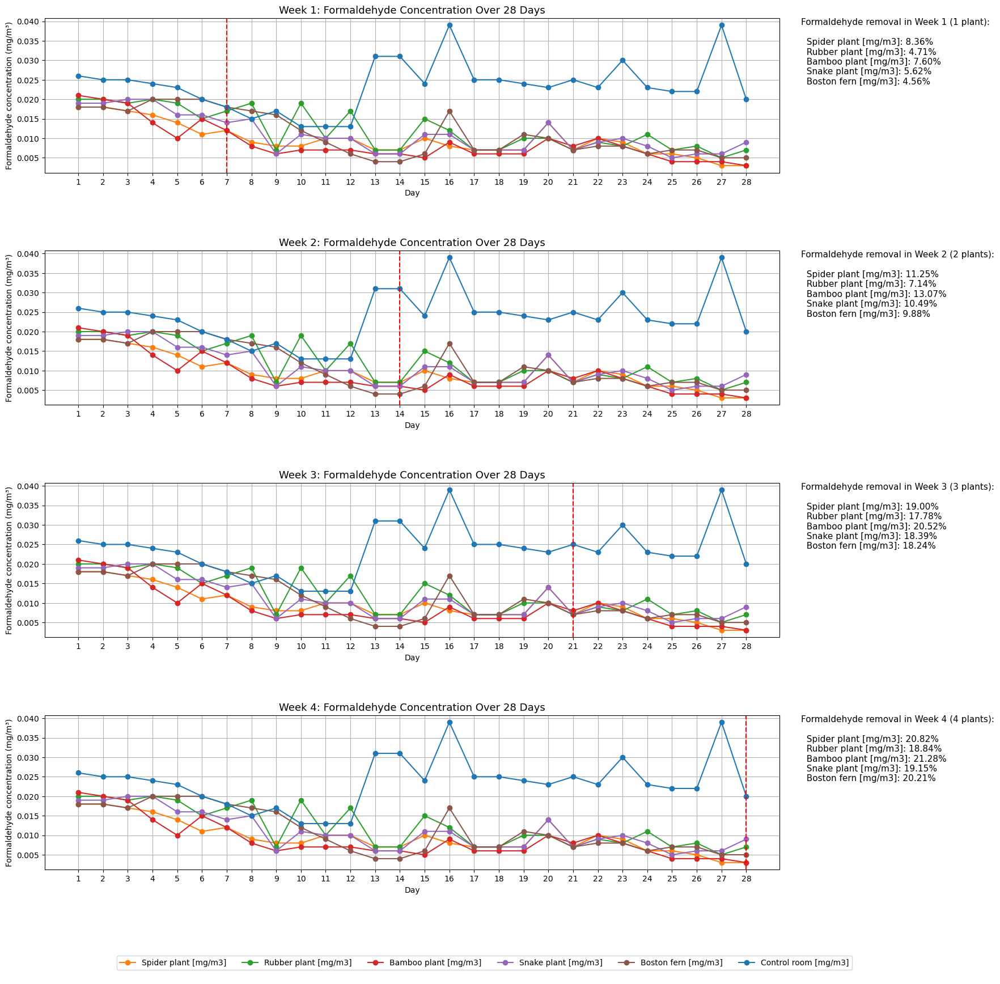

In [156]:
# sort data by Day
df_sorted = df_fm_removal.sort_values(by="Day").copy()
df_sorted["Day"] = range(1, len(df_sorted) + 1)

control_col = "Control room [mg/m3]"
plant_cols = [col for col in df_sorted.columns if col not in ["No. Plants", "Day", "Week", control_col]]

# calculate differences for later percentage display
diff_df = df_sorted[plant_cols].subtract(df_sorted[control_col], axis=0)
total_control_pm = df_sorted[control_col].sum()

# set up color mapping from original plot
fig_temp, ax_temp = plt.subplots()
line_colors = {}

for col in df_sorted.columns:
    if col in ["No. Plants", "Day", "Week"]:
        continue
    line = ax_temp.plot(df_sorted["Day"], df_sorted[col], label=col)[0]
    line_colors[col] = line.get_color()

plt.close(fig_temp)

def plot_static_formaldehyde_weeks_stacked():
    fig = plt.figure(figsize=(20, 22))
    gs = fig.add_gridspec(nrows=5, ncols=2, width_ratios=[6, 1], height_ratios=[1, 1, 1, 1, 0.2], hspace=0.6, wspace=0.05)

    legend_handles = []
    legend_labels = []

    for i in range(4):
        week = i + 1
        ax = fig.add_subplot(gs[i, 0])
        ax_text = fig.add_subplot(gs[i, 1])
        ax_text.axis("off")

        # plot all series (plants + control)
        for col in plant_cols + [control_col]:
            line, = ax.plot(
                df_sorted["Day"], 
                df_sorted[col], 
                marker='o', 
                label=col.replace(" [%]", ""),
                color=line_colors[col]
            )
            if i == 0:
                legend_handles.append(line)
                legend_labels.append(col.replace(" [%]", ""))

        # vertical red week divider
        ax.axvline(x=week * 7, color='red', linestyle='--', linewidth=1.5)
        ax.set_title(f"Week {week}: Formaldehyde Concentration Over 28 Days", fontsize=13)
        ax.set_xlabel("Day")
        ax.set_ylabel("Formaldehyde concentration (mg/m³)")
        ax.set_xticks(range(1, 29))
        ax.grid(True)

        # summary text panel
        start_day = (week - 1) * 7
        end_day = start_day + 7
        selected_diff = diff_df.iloc[start_day:end_day]
        week_total_removal = (-selected_diff.sum() / total_control_pm) * 100
        num_plants = week

        text_str = f"Formaldehyde removal in Week {week} ({num_plants} plant{'s' if num_plants > 1 else ''}):\n\n"
        for plant, removal in week_total_removal.items():
            text_str += f"  {plant.replace(' [%]', '')}: {removal:.2f}%\n"

        ax_text.text(
            0, 1, text_str,
            fontsize=11,
            va='top',
            ha='left',
            wrap=True,
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )

    # shared legend at bottom
    ax_legend = fig.add_subplot(gs[4, :])
    ax_legend.axis("off")
    ax_legend.legend(
        handles=legend_handles,
        labels=legend_labels,
        loc='center',
        ncol=len(legend_handles),
        fontsize=10
    )

    plt.show()

plot_static_formaldehyde_weeks_stacked()

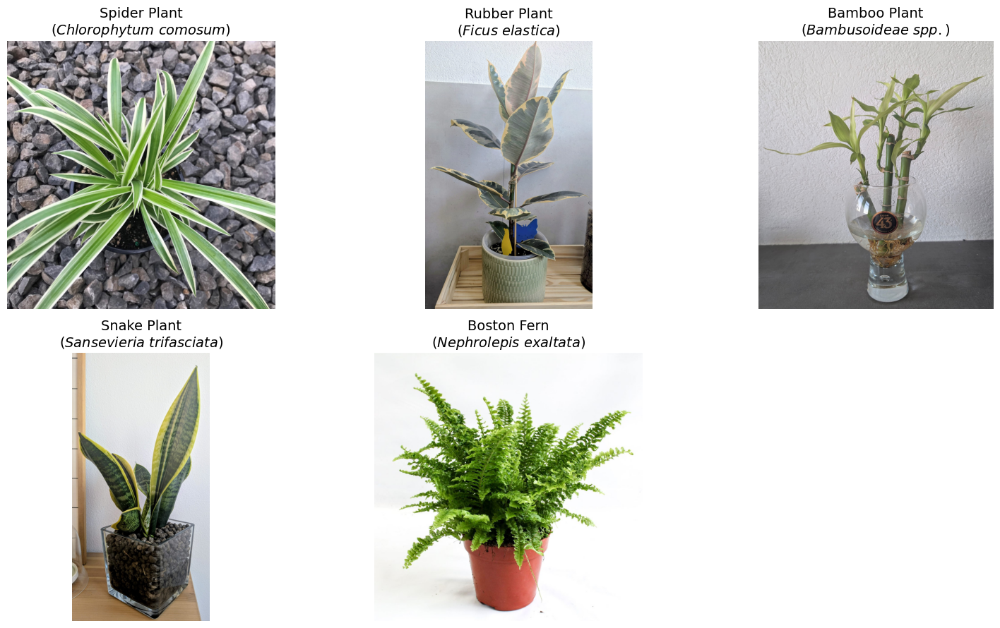

In [157]:
from PIL import Image
import os

# file names in order
filenames = [
    "spider_plant.jpg",
    "rubber_plant.jpg",
    "bamboo_plant.jpg",
    "snake_plant.jpg",
    "boston_fern.jpg"
]

# common and scientific names
names = [
    ("Spider Plant", "Chlorophytum comosum"),
    ("Rubber Plant", "Ficus elastica"),
    ("Bamboo Plant", "Bambusoideae spp."),
    ("Snake Plant", "Sansevieria trifasciata"),
    ("Boston Fern", "Nephrolepis exaltata")
]

# load images
folder = "../images"
images = [Image.open(os.path.join(folder, fname)) for fname in filenames] # creates the full path to each image file

# create figure with gridspec: 2 rows, 5 columns
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, figure=fig)

# columns for top row images (3 images)
top_cols = [0, 1, 2]

# columns for bottom row images (2 images), centered in columns 0 and 2
bottom_cols = [0, 1]

# plot top row images with titles
for img, col, (common, sci) in zip(images[:3], top_cols, names[:3]):
    ax = fig.add_subplot(gs[0, col])
    ax.imshow(img)
    ax.set_title(f"{common}\n" + r"$\it{{({0}\ {1})}}$".format(*sci.split()), fontsize=14)

    ax.axis('off')

# plot bottom row images with titles
for img, col, (common, sci) in zip(images[3:], bottom_cols, names[3:]):
    ax = fig.add_subplot(gs[1, col])
    ax.imshow(img)
    ax.set_title(f"{common}\n" + r"$\it{{({0}\ {1})}}$".format(*sci.split()), fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()

## NO2 removal

"Here, we investigate whether potted plants can contribute as a simple and cost-effective indoor air pollution mitigation technique. Our study investigates the ability of the combination of the three plant species Spathiphyllum wallisii ‘Verdi’, Dracaena fragrans ‘Golden Coast’ and Zamioculcas zamiifolia with two different growing media to remove in situ concentrations (100 ppb) of NO2 in real-time at two typical indoor light levels (0 and 500 lx) and in ‘wet’ and ‘dry’ growing media conditions."

Reference: Potted plants can remove the pollutant nitrogen dioxide indoors, 2022. DOI: 10.1007/s11869-022-01171-6.

In [158]:
df_NO2_removal = pd.read_excel("../data/NO2_plant_removal.xlsx")

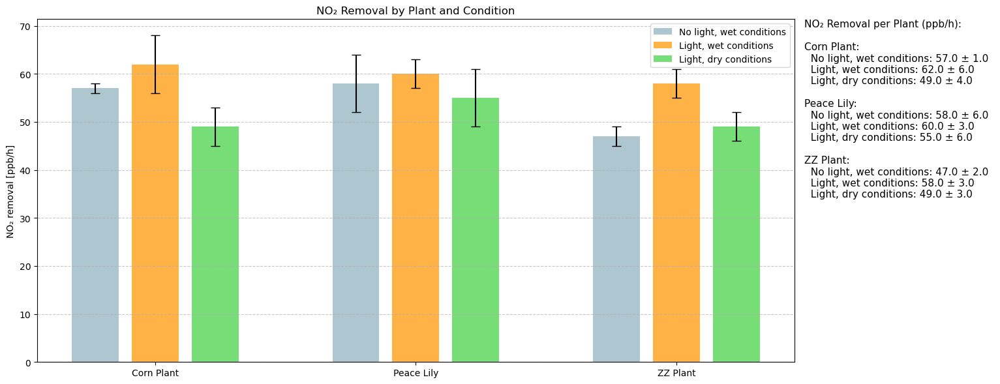

In [159]:
df = df_NO2_removal.copy()
labels = df["Plant"]
n_plants = len(labels)
conditions = ["No light, wet conditions", "Light, wet conditions", "Light, dry conditions"]
colors = ["#AEC6CF", "#FFB347", "#77DD77"]  # pastel blue, orange, green

# map scientific names to common names (only for plot and text)
common_names_map = {
    "Dracaena fragrans": "Corn Plant",
    "Spathiphyllum wallisii ‘Verdi’": "Peace Lily",
    "Zamioculcas zamiifolia": "ZZ Plant"
}
labels_common = [common_names_map.get(name, name) for name in labels]

x = np.arange(n_plants)
bar_width = 0.18  # keep bars narrow to allow spacing

# add spacing between bars within each group by increasing bar gap
bar_spacing = 0.05

# positions for bars within each group, adding spacing
positions = [
    x - bar_width - bar_spacing,  # first bar left shifted
    x,                           # second bar center
    x + bar_width + bar_spacing   # third bar right shifted
]

fig = plt.figure(figsize=(16, 6))
spec = gridspec.GridSpec(ncols=2, nrows=1, width_ratios=[4, 1])

ax = fig.add_subplot(spec[0])

# plot bars with error bars, spaced nicely within each group
ax.bar(positions[0], df["No wet [ppb/h]"], bar_width, yerr=df["No wet_sd [ppb/h]"], label="No light, wet conditions", color=colors[0], capsize=5)
ax.bar(positions[1], df["Typical wet [ppb/h]"], bar_width, yerr=df["Typical wet_sd [ppb/h]"], label="Light, wet conditions", color=colors[1], capsize=5)
ax.bar(positions[2], df["Typical dry [ppb/h]"], bar_width, yerr=df["Typical dry_sd [ppb/h]"], label="Light, dry conditions", color=colors[2], capsize=5)

# x ticks are centered at the middle bar position (positions[1])
ax.set_xticks(x)
ax.set_xticklabels(labels_common, ha='center')

ax.set_ylabel("NO₂ removal [ppb/h]")
ax.set_title("NO₂ Removal by Plant and Condition")
ax.legend()

ax.grid(axis='y', linestyle='--', alpha=0.7)

# text box on right, no box edge, white transparent background
text_lines = ["NO₂ Removal per Plant (ppb/h):\n"]
for idx, plant in enumerate(labels_common):
    text_lines.append(f"{plant}:")
    text_lines.append(f"  No light, wet conditions: {df.loc[idx, 'No wet [ppb/h]']:.1f} ± {df.loc[idx, 'No wet_sd [ppb/h]']:.1f}")
    text_lines.append(f"  Light, wet conditions: {df.loc[idx, 'Typical wet [ppb/h]']:.1f} ± {df.loc[idx, 'Typical wet_sd [ppb/h]']:.1f}")
    text_lines.append(f"  Light, dry conditions: {df.loc[idx, 'Typical dry [ppb/h]']:.1f} ± {df.loc[idx, 'Typical dry_sd [ppb/h]']:.1f}")
    text_lines.append("")

text_str = "\n".join(text_lines)

ax_text = fig.add_subplot(spec[1])
ax_text.axis("off")
ax_text.text(
    0, 1, text_str,
    fontsize=11,
    va='top',
    ha='left',
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)

plt.tight_layout()
plt.show()

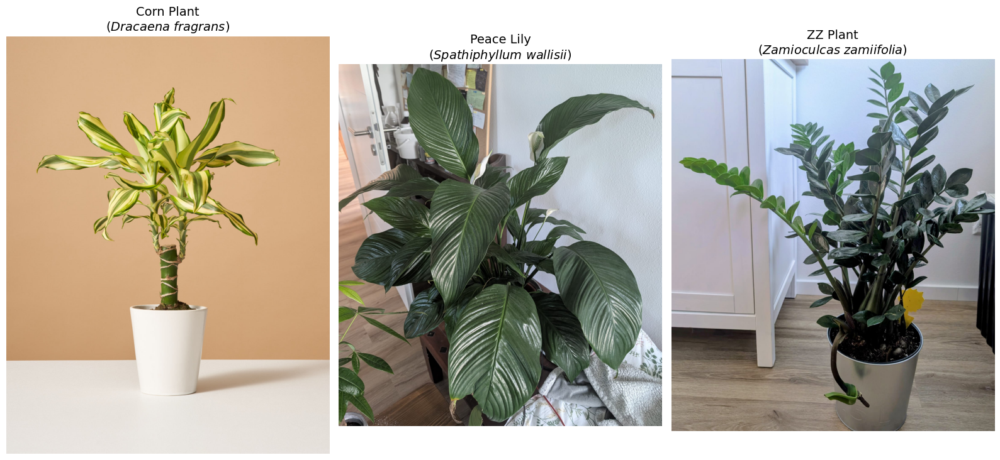

In [160]:
# file names in order
filenames = [
    "corn_plant.jpg",
    "peace_lily.jpg",
    "ZZ_plant.jpg"
]

# common and scientific names
names = [
    ("Corn Plant", "Dracaena fragrans"),
    ("Peace Lily", "Spathiphyllum wallisii ‘Verdi’"),
    ("ZZ Plant", "Zamioculcas zamiifolia")
]

# load images
folder = "../images"
images = [Image.open(os.path.join(folder, fname)) for fname in filenames]

# create figure with gridspec: 1 row, 3 columns
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(1, 3, figure=fig)

# columns for row images (3 images)
top_cols = [0, 1, 2]

# plot row images with titles
for img, col, (common, sci) in zip(images[:3], top_cols, names[:3]):
    ax = fig.add_subplot(gs[0, col])
    ax.imshow(img)
    ax.set_title(f"{common}\n" + r"$\it{{({0}\ {1})}}$".format(*sci.split()), fontsize=14)

    ax.axis('off')

plt.tight_layout()
plt.show()